# Группа: DST-48
Sergey Pinaev (binom1982@gmail.com)
# Проект №4. Компьютер говорит "Нет"
Ссылка на соревнование: [[SF-DST] Credit Scoring](https://www.kaggle.com/c/sf-dst-scoring)
<p align="center" width="100%">
    <img src="https://www.nfcc.org/wp-content/uploads/2020/09/bigstock-Credit-Score-Concept-Business-384487778-768x477.jpg"> 
</p>

## Task
Представьте, что вы работаете стажером в отделении регионального банка. Вы все также делаете запросы к базам данных и строите отчеты. Вы поймали себя на мысли, что представляли работу дата-саентиста совсем иначе…

И вот сегодня, когда вы уже были на пороге отчаяния, ваш начальник пришел к вам с долгожданной новостью. Будем строить модель!

“Отлично,” – думаете вы, – “наконец-то смогу заняться настоящей работой!”

Задача: построить скоринг модель для вторичных клиентов банка, которая бы предсказывала вероятность дефолта клиента.

## Data Description:
1. **client_id** - идентификатор клиента
1. **education** - уровень образования
1. **sex** - пол заёмщика
1. **age** - возраст заёмщика
1. **car** - флаг наличия автомобиля
1. **car_type** - флаг автомобиля-иномарки
1. **decline_app_cnt** - количество отказанных прошлых заявок
1. **good_work** -флаг наличия «хорошей» работы
1. **bki_request_cnt** - количество запросов в БКИ
1. **home_address** - категоризатор домашнего адреса
1. **work_address** - категоризатор рабочего адреса
1. **income	доход** - заёмщика
1. **foreign_passport** - наличие загранпаспорта
1. **sna** - связь с клиентом банка
1. **first_time** - давность информации о клиенте
1. **score_bki** - BKI очки
1. **region_rating** - райтинг региона
1. **app_date** - дата заявки
1. **default** - наличие дефолта

## Libraries

In [2]:
from pandas import Series
import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler, RobustScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.feature_selection import RFE # Рекурсивное устранение признаков (RFE)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.calibration import CalibratedClassifierCV

from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier

# Отключаем ограничение при просмотре датасета на ширину столбцов и их количество
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# pd.set_option('max_colwidth', -1)

# Подключаем форматирование Markdown
from IPython.display import Markdown
from matplotlib.ticker import PercentFormatter

import datetime

import warnings
warnings.filterwarnings("ignore",category=UserWarning)
# pd.options.mode.chained_assignment = None
%matplotlib inline


from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter



from catboost import CatBoost,CatBoostClassifier, Pool
from catboost.utils import get_roc_curve
import lightgbm

from sklearn.naive_bayes import MultinomialNB


# Compare Algorithms
from sklearn import model_selection
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [3]:
%time 
is_kaggle_or_github = False # в зависимости от использования kaggle или github, задается соответствующий путь к датасетам

if is_kaggle_or_github:
    data_directory = '/kaggle/input/sf-dst-scoring/'
else: 
    data_directory = 'data/' 
 
df_train = pd.read_csv(data_directory+'train.csv')
df_test = pd.read_csv(data_directory+'test.csv')

sample_submission = df_test[['client_id']]
sample_submission['default'] = -1
# sample_submission = pd.read_csv(data_directory+'/sample_submission.csv')

Wall time: 0 ns
<ipython-input-3-0e72b9d434cb>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_submission['default'] = -1


In [4]:
print('Train dataset: info\n')
print(df_train.info())
print('Test dataset: info\n')
print(df_test.info())
print('Submission dataset: info\n')
sample_submission.info()

Train dataset: info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        7

## Functions

In [74]:
def top_freq_value(series, delimiter=' ', dropna=True, top=0):
    '''Выводит статистику самых встречающихся значений в столбце'''
    value_series = series.value_counts(dropna=dropna)
    value_list = [f'{index} - {value}' for index, value in value_series.items()]

    if top == 0:
        return delimiter.join(value_list)
    else:
        return delimiter.join(value_list[0:10])
#         return delimiter.join(value_list[0:min(top, len(value_series))])
    
    
def top_freq_value_markdown(series, delimiter=' ', dropna=True, top=0):
    '''Выводит статистику самых встречающихся значений в столбце в разметке markdown'''
    value_series = series.value_counts(dropna=dropna)
    value_list = [f'{index} - {value}' if str(index) != 'nan' else f'**{index} - {value}**' for index, value in value_series.items()]

    if top == 0:
        return delimiter.join(value_list)
    else:
        return delimiter.join(value_list[0:min(top, len(value_series))])


def dataset_custom_description(dataset):
    '''Выводит дополнительную информацию о датасете'''

    count_any_null = dataset[dataset.isnull().any(1)].shape[0]
    count_not_any_null = dataset.shape[0] - count_any_null
    types_info = "<br>".join([f'{index} ({value})' for index, value in dataset.dtypes.value_counts().items()])

    display(Markdown(f'## Общая информация'))
    display(Markdown(f'''| Характеристика   |      Значение      |
                        |:----------|:-------------|
                        |**количество (строк, столбцов):**|({dataset.shape[0]}, {dataset.shape[1]})|\n|**количество строк (ни одного пустого значения):**|{count_not_any_null}|\n|**количество строк (хотябы одно пустое значение):**|{count_any_null}|\n|**распределение типов столбцов:**|{types_info}|
                        '''))

    # формируем более информативную таблицу о датасете
    display(Markdown(f'## Информация о столбцах'))
    data = {'name': [], 'type': [], 'non_null': [], 'null': [], 'null_mean': [],
            'unique': [], 'mean': [], 'std': [], 'min': [], 
            '25%': [], '50%': [], '75%': [], 'max': [], 'distribution (10 first values)': []}

    for column_name, column_type in dataset.dtypes.items():
        column_series = dataset[column_name]
        
        data['name'].append(column_name)
        data['type'].append(str(column_type))
        data['non_null'].append(column_series.count())
        data['null'].append(column_series.isna().sum())
        data['null_mean'].append(f'{column_series.isna().mean() :.1%}')
        data['unique'].append(column_series.nunique())
       
        data['mean'].append(f'{column_series.mean() :.2f}' if column_series.dtype != 'object' else '')
        data['std'].append(f'{column_series.std() :.2f}' if column_series.dtype != 'object' else '')

        data['min'].append(column_series.min() if column_series.dtype != 'object' else '')
        data['25%'].append(column_series.quantile(0.25) if column_series.dtype != 'object' else '')
        data['50%'].append(column_series.quantile(0.5) if column_series.dtype != 'object' else '')
        data['75%'].append(column_series.quantile(0.75) if column_series.dtype != 'object' else '')
        data['max'].append(column_series.max() if column_series.dtype != 'object' else '')
        
        data['distribution (10 first values)'].append(top_freq_value(column_series, ' | ', False, 10))
        
    data = pd.DataFrame(data=data)
    #data = data.style.highlight_max(axis=0)

    with pd.option_context('display.max_colwidth', None, 'display.max_rows', None, 'display.max_columns', None):
        display(data)


def custom_boxplot(dataset, x, y, reverse=True,  ncols=1, showfliers=False, figsize=(20, 10)):
    '''Отображает boxplot c дополнительными настройками '''
    num_features = x
#     print((1 if len(num_features)%ncols else 0))
    fig, axes = plt.subplots(nrows=int(len(num_features)/ncols) + (1 if len(num_features)%ncols else 0), ncols=ncols, figsize=figsize)
   
    for index, col in enumerate(num_features):
        if reverse:
            if ncols == 1:
                sns.boxplot(y=col, x=y, data=dataset, ax= axes[int(index / ncols)], showfliers=showfliers)
            elif ncols == 2 or ncols == 3:
                sns.boxplot(y=col, x=y, data=dataset, ax= axes[int(index / ncols), index % ncols], showfliers=showfliers)        
        else:
            if ncols == 1:
                sns.boxplot(x=col, y=y, data=dataset, ax= axes[int(index / ncols)], showfliers=showfliers)
            elif ncols == 2 or ncols == 3:
                sns.boxplot(x=col, y=y, data=dataset, ax= axes[int(index / ncols), index % ncols], showfliers=showfliers)
        
    plt.tight_layout()
        

def scatter_for_two_columns_with_count(dataset, value_x, value_y, figsize=(25,40)):
    '''Строит график зависимости x от y с цветовым количественным показателем'''
    dataset_group = dataset.groupby([value_x, value_y]).size().to_frame('count').reset_index()
    dataset_group.sort_values(by='count', ascending=False, inplace=True, )
    # display(dataset_group)

    plt.figure(figsize=figsize)
    plt.xticks(rotation='vertical')
    # dataset_group = dataset_group[dataset_group['count'] > 10]
    plt.scatter(dataset_group[value_x],dataset_group[value_y],dataset_group['count'], c=np.random.rand(dataset_group.shape[0]));
    plt.tight_layout()

    
def heatmap_custom(dataframe, figsize=(30,15)):
    '''heatmap - корреляция Пирсона с дополнительными настроками'''
    matrix = np.triu(dataframe.corr())
    fig, ax = plt.subplots(figsize=figsize)
    sns_plot = sns.heatmap(
        dataframe.corr().abs(), square=False, annot=True, 
        fmt=".2%", linewidths=0.1, cmap="tab20", annot_kws={'size':12}, #Set1 tab20
        center=0, vmin=0, vmax=1, mask=matrix);
    cbar = ax.collections[0].colorbar
    cbar.ax.yaxis.set_major_formatter(PercentFormatter(1, 0))
    plt.tight_layout()
#     sns_plot.savefig("heatmap.png")
    
    
def delete_column_if_exist(dataframe, column):
    '''Удаляет столбец из датафрейма если он существует'''
    if column in dataframe.columns:
#         print(column)
        dataframe.drop([column], axis=1, inplace=True)


def outlier_replace(df,columns):
    '''Заменяет выбросы в столбцах нижней и верхней границей соответсвенно'''
    for i in columns:
        quartile_1,quartile_3 = np.percentile(df[i],[25,75])
        quartile_f,quartile_l = np.percentile(df[i],[1,99])
        IQR = quartile_3-quartile_1
        lower_bound = quartile_1 - (1.5*IQR)
        upper_bound = quartile_3 + (1.5*IQR)
        print(i,lower_bound,upper_bound,quartile_f,quartile_l)
        
        df[i].loc[df[i] < lower_bound] = quartile_f
        df[i].loc[df[i] > upper_bound] = quartile_l


def display_metrics(model, X, y, title='Metrics and confusion matrix'):
    '''Выводит основные метрики и confusion matrix'''
    y_pred = model.predict(X)
    y_probs = model.predict_proba(X)
    y_probs = y_probs[:,1]

    message = f'roc_auc: {round(roc_auc_score(y,y_probs),3)}\n\
f1: {round(f1_score(y, y_pred),3)}\n\
recall: {round(recall_score(y, y_pred),3)}\n\
precision: {round(precision_score(y, y_pred),3)}\n\
accuracy: {round(accuracy_score(y, y_pred),3)}'
    
    fpr, tpr, threshold = roc_curve(y, y_probs)
    roc_auc = roc_auc_score(y, y_probs)

    fig, ax = plt.subplots(2, 2, figsize=(12, 10), tight_layout = True)
    fig.suptitle(title)
    # plt.figure()
    ax[0,1].plot([0, 1], label='Baseline', linestyle='--')
    ax[0,1].plot(fpr, tpr, label = 'Estimator')
    ax[0,1].set_title('ROC curve (area = %0.3f)' % roc_auc)
    ax[0,1].set_ylabel('True Positive Rate')
    ax[0,1].set_xlabel('False Positive Rate')
    ax[0,1].legend(loc="lower right")
    # ax[0].legend(loc = 'lower right')
    # plt.show()
    ax[0,0].text(0.1, 0.5,  message, horizontalalignment='left', verticalalignment='center', fontsize=24)
    
    # Абсолютные значения
    cm = confusion_matrix(y, y_pred)
    cmd = ConfusionMatrixDisplay(cm, display_labels=['non_default','default']) 
    cmd.plot(ax=ax[1,0], cmap=plt.cm.Blues)
    cmd.ax_.set_title('Абсолютные значения значения')
    cmd.ax_.set(xlabel='Предсказанный класс', ylabel='Истинный класс')
    
    # Нормализованные значения
    #  normalize{‘true’, ‘pred’, ‘all’}, default=None
    
   
    cm1 = confusion_matrix(y, y_pred, normalize='pred')
    cmd = ConfusionMatrixDisplay(cm1, display_labels=['non_default','default']) 
    cmd.plot(ax=ax[1,1], cmap=plt.cm.Blues, values_format='0.0%')
    cmd.ax_.set_title('Нормализованные значения')
    cmd.ax_.set(xlabel='Предсказанный класс', ylabel='Истинный класс')

    message = message.replace("\n"," | ") 
    print(f'[{datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")} - {title}]\n{ message }')
    print(f'confusion_matrix:\n{ cm }')
    #support — это число вхождений каждого класса в y
    #print(classification_report(y, y_pred))        


def display_metrics_awesome(model, X_t, y_t, title='Metrics and confusion matrix', positive=0, figsize=(10, 5)):
    '''Выводит основные метрики и confusion matrix'''
    
    if positive==1:
        y_t = [ (x+1)%2 for x in y_t]
    
    y_pred = model.predict(X_t)
    y_probs = model.predict_proba(X_t)
    y_probs = y_probs[:,1]
   
    fpr, tpr, threshold = roc_curve( y_t, y_probs)
    roc_auc = roc_auc_score(y_t, y_probs)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, tight_layout = True)
    fig.suptitle(title)
    
    # plt.figure()
    ax1.plot([0, 1], label='Baseline', linestyle='--')
    ax1.plot(fpr, tpr, label = type(model).__name__)
    ax1.set_title('ROC curve (area = %0.3f)' % roc_auc)
    ax1.set_ylabel('True Positive Rate')
    ax1.set_xlabel('False Positive Rate')
#     ax1.legend(loc="lower right")
  
    cf_matrix = confusion_matrix(y_t, y_pred)
  
    group_names = ['True Positive','False Negative','False Positive','True Negative']
#     group_names = ['TN','FP','FN','TP']
    # group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = [f'{value:0.0f}' for value in cf_matrix.flatten()]
    group_percentages = [f'{value:.2%}' for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n\n{v2}\n\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    
    ax2.set_title(f'Confusion matrix (positive class: {positive})')
  
    sns.heatmap(cf_matrix / np.sum(cf_matrix), ax= ax2, annot=labels, fmt='', cmap='tab10_r', linewidths=1,
                vmin=0, vmax=1, square=True, xticklabels=['Positive','Negative'], yticklabels=['Positive','Negative']);
    ax2.set(xlabel='Predicted Value', ylabel='Actual Value')
   
    message = f'roc_auc: {round(roc_auc_score(y_t,y_probs),3)} | f1: {round(f1_score(y_t, y_pred),3)} | \
recall: {round(recall_score(y_t, y_pred),3)} | precision: {round(precision_score(y_t, y_pred),3)} | accuracy: {round(accuracy_score(y_t, y_pred),3)}'
   
    print(f'[{datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")} - {title}]\n{ message }')
    print(f'confusion_matrix:\n{ cf_matrix }')
    
    
# num of unique values, first 10 unique values, null values count, type
# data.agg({'nunique', lambda s: s.unique()[:10]})\
#     .append(pd.Series(data.isnull().sum(), name='null'))\
#     .append(pd.Series(data.dtypes, name='dtype'))\
#     .transpose()

# https://www.kaggle.com/sudhirnl7/logistic-regression-with-stratifiedkfold
# k= pd.DataFrame()
# k['train']= train.isnull().sum()
# k['test'] = test.isnull().sum()
# k.T

# fig ,ax = plt.subplots(2,2,figsize=(16,16))
# ax1,ax2,ax3,ax4 = ax.flatten()
# sns.countplot(data=train,x='Pclass',hue='Survived',palette='gist_rainbow',ax=ax1)
# sns.countplot(data=train,x='Sex',hue='Survived',palette='viridis',ax=ax2)
# sns.countplot(data=train,x='SibSp',hue='Survived',palette='viridis',ax=ax3)
# sns.countplot(data=train,x='Parch',hue='Survived',palette='gist_rainbow',ax=ax4)

# fig,ax = plt.subplots(2,2,figsize=(16,16))
# ax1,ax2,ax3,ax4 = ax.flatten()
# sns.distplot(train['Age'],bins=20,color='r',ax=ax1)
# sns.boxplot(y='Age',x='Survived',data=train,ax=ax2)
# sns.pointplot(y='Age',x='Survived',data=train,ax=ax3)
# sns.violinplot(y='Age',x='Survived',data=train,ax=ax4)

# fig,ax = plt.subplots(2,1,figsize=(16,8))
# ax1,ax2 = ax.flatten()
# sns.countplot(data=train,x='name_category',hue='Survived',ax=ax1,palette='gist_rainbow')
# sns.countplot(data=train,x='no_word',hue='Survived',palette='viridis',ax=ax2)

# plt.figure(figsize=(16,8))
# sns.countplot(data=train,x='no_cabin',hue='Survived',palette='gist_rainbow')

# le = LabelEncoder()
# #col =['Sex']
# train1['Sex'] = le.fit_transform(train1['Sex'])
# test1['Sex'] = le.fit_transform(test1['Sex'])
# train1.head().T

## Create dataset

In [6]:
# Объединим train и test датасеты
df_train['train'] = True # mark as train 
df_test['train'] = False # mark as test
df_test['default'] = -1

data = pd.concat([df_train, df_test], ignore_index=True)

# Посмотрим на характеристики датасета
dataset_custom_description(data[data.train])

## Общая информация

| Характеристика   |      Значение      |
                        |:----------|:-------------|
                        |**количество (строк, столбцов):**|(73799, 20)|
|**количество строк (ни одного пустого значения):**|73492|
|**количество строк (хотябы одно пустое значение):**|307|
|**распределение типов столбцов:**|int64 (12)<br>object (6)<br>bool (1)<br>float64 (1)|
                        

## Информация о столбцах

,name,type,non_null,null,null_mean,unique,mean,std,min,25%,50%,75%,max,distribution (10 first values)
0,client_id,int64,73799,0,0.0%,73799,55137.97,31841.92,1,27440.5,55274,82758.5,110147,6141 - 1 | 42113 - 1 | 29467 - 1 | 19228 - 1 | 21279 - 1 | 109344 - 1 | 107297 - 1 | 101156 - 1 | 99109 - 1 | 105254 - 1
1,app_date,object,73799,0,0.0%,120,,,,,,,,18MAR2014 - 1018 | 17MAR2014 - 911 | 19MAR2014 - 909 | 31MAR2014 - 904 | 07APR2014 - 882 | 02APR2014 - 869 | 11MAR2014 - 865 | 05MAR2014 - 841 | 28JAN2014 - 836 | 04MAR2014 - 824
2,education,object,73492,307,0.4%,5,,,,,,,,SCH - 38860 | GRD - 23365 | UGR - 9816 | PGR - 1257 | nan - 307 | ACD - 194
3,sex,object,73799,0,0.0%,2,,,,,,,,F - 41562 | M - 32237
4,age,int64,73799,0,0.0%,52,39.28,11.52,21,30,37,48,72,31 - 2727 | 28 - 2705 | 30 - 2693 | 29 - 2659 | 27 - 2645 | 26 - 2528 | 32 - 2501 | 34 - 2395 | 33 - 2314 | 35 - 2259
5,car,object,73799,0,0.0%,2,,,,,,,,N - 49832 | Y - 23967
6,car_type,object,73799,0,0.0%,2,,,,,,,,N - 59791 | Y - 14008
7,decline_app_cnt,int64,73799,0,0.0%,21,0.28,0.80,0,0,0,0,33,0 - 61214 | 1 - 8397 | 2 - 2468 | 3 - 903 | 4 - 414 | 5 - 165 | 6 - 113 | 7 - 48 | 9 - 24 | 8 - 19
8,good_work,int64,73799,0,0.0%,2,0.16,0.37,0,0,0,0,1,0 - 61630 | 1 - 12169
9,score_bki,float64,73799,0,0.0%,69096,-1.90,0.50,-3.62459,-2.25953,-1.92082,-1.56983,0.199773,-1.77526279 - 352 | -2.22500363 - 296 | -2.1042109 - 288 | -2.16966378 - 258 | -1.92082293 - 185 | -2.02410005 - 180 | -2.38726804 - 169 | -1.52642194 - 145 | -2.44723899 - 142 | -2.35305175 - 116


## Data Description:
1. **client_id** - идентификатор клиента
1. **education** - уровень образования
1. **sex** - пол заёмщика
1. **age** - возраст заёмщика
1. **car** - флаг наличия автомобиля
1. **car_type** - флаг автомобиля-иномарки
1. **decline_app_cnt** - количество отказанных прошлых заявок
1. **good_work** -флаг наличия «хорошей» работы
1. **bki_request_cnt** - количество запросов в БКИ
1. **home_address** - категоризатор домашнего адреса
1. **work_address** - категоризатор рабочего адреса
1. **income	доход** - заёмщика
1. **foreign_passport** - наличие загранпаспорта
1. **sna** - связь с клиентом банка
1. **first_time** - давность информации о клиенте
1. **score_bki** - BKI очки
1. **region_rating** - райтинг региона
1. **app_date** - дата заявки
1. **default** - наличие дефолта

# EDA

In [7]:
# Полученные признаки разобьем на три категории для удобства дальнейшего анализа
# бинарные
bin_cols = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport'] 
# числовые
num_cols = ['age', 'decline_app_cnt', 'score_bki', 'income', 'bki_request_cnt', 'region_rating'] 
# категориальные
cat_cols = ['education', 'work_address', 'home_address', 'sna', 'first_time'] 

# признаки client_id и app_date посмотрим отдельно

In [8]:
display(round(data[data.train].groupby('default').mean(),2))

,client_id,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,train
default,,,,,,,,,,,,,
0,55614.54,39.39,0.24,0.17,-1.94,1.93,57.17,1.56,2.47,41799.71,1.68,2.81,True
1,51861.81,38.53,0.52,0.12,-1.68,2.46,53.68,1.69,2.64,36288.11,2.10,2.49,True


**Наблюдения**
- клиенты не допустившие дефолт имеют больше иномарок
- клиенты допустившие дефолт имеют значительно больше отклоненных в прошлом заявок
- клиенты допустившие дефолт имеют меньше score_bki
- клиенты допустившие дефолт делают большее число запросов в БКИ
- клиенты не допустившие дефолт имеют более высокий доход
- клиенты допустившие дефолт имеют болший показатель sna (возможно это родственные связи с другим клиентом банка от 1 до 4)
- клиенты допустившие дефолт реже имеют заграничный паспорт

## Binary features

In [9]:
# Посмотрим информацию бинарных признаков
dataset_custom_description(data[bin_cols])

## Общая информация

| Характеристика   |      Значение      |
                        |:----------|:-------------|
                        |**количество (строк, столбцов):**|(110148, 5)|
|**количество строк (ни одного пустого значения):**|110148|
|**количество строк (хотябы одно пустое значение):**|0|
|**распределение типов столбцов:**|object (4)<br>int64 (1)|
                        

## Информация о столбцах

,name,type,non_null,null,null_mean,unique,mean,std,min,25%,50%,75%,max,distribution (10 first values)
0,sex,object,110148,0,0.0%,2,,,,,,,,F - 61836 | M - 48312
1,car,object,110148,0,0.0%,2,,,,,,,,N - 74290 | Y - 35858
2,car_type,object,110148,0,0.0%,2,,,,,,,,N - 89140 | Y - 21008
3,good_work,int64,110148,0,0.0%,2,0.17,0.37,0,0,0,0,1,0 - 91917 | 1 - 18231
4,foreign_passport,object,110148,0,0.0%,2,,,,,,,,N - 93721 | Y - 16427


['sex', 'car', 'car_type', 'good_work', 'foreign_passport']

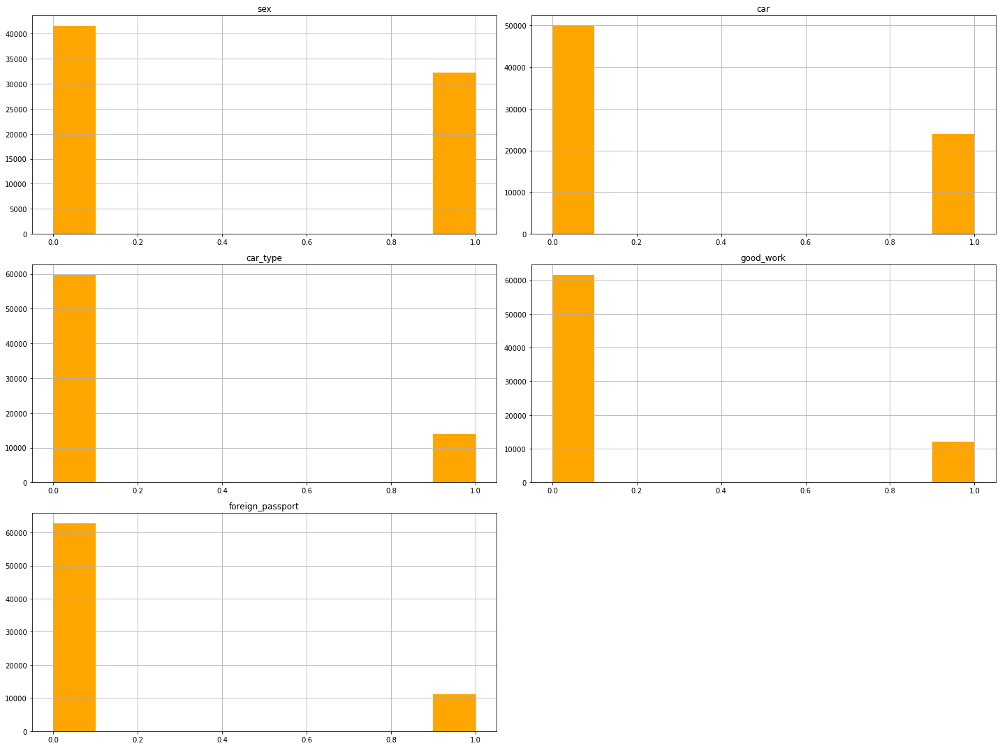

In [10]:
# Применим LabelEncoder ко всему набору бинарных переменных. Можно обратиться к classes_ , если забыли, что закодировали. 
label_encoder = LabelEncoder()

for column in bin_cols:
    data[column] = label_encoder.fit_transform(data[column])
    # print(dict(enumerate(label_encoder.classes_)))

data[data.train][bin_cols].hist(figsize=(20,15), log=False, color='orange');
plt.tight_layout()
bin_cols

## Numerical features

['age',
 'decline_app_cnt',
 'score_bki',
 'income',
 'bki_request_cnt',
 'region_rating']

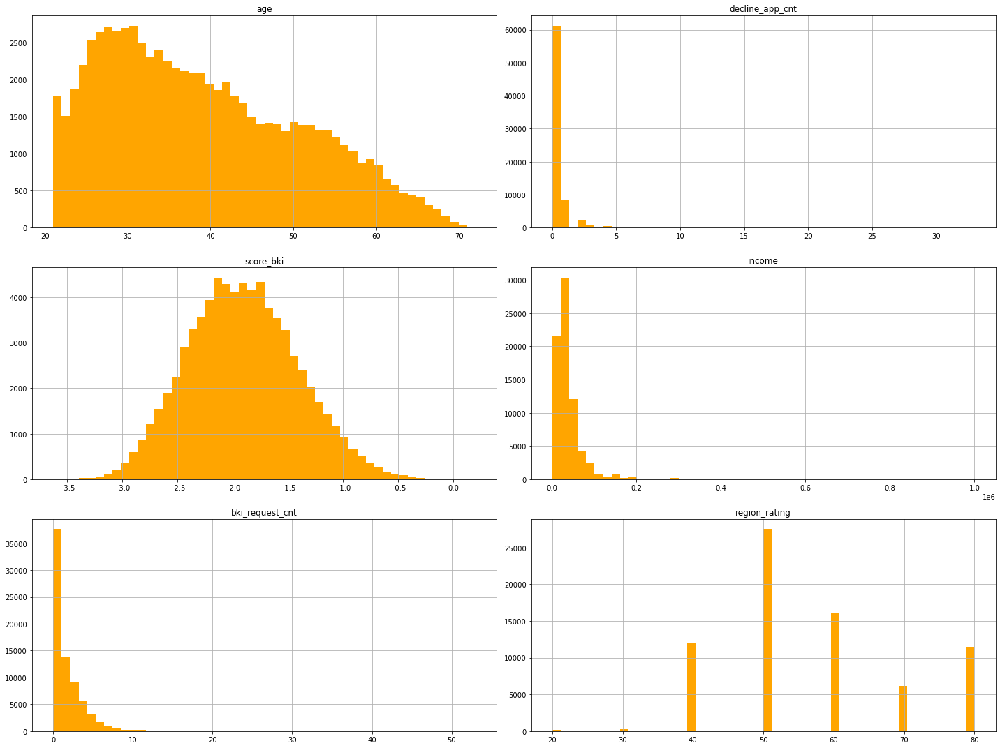

In [11]:
# Посмотрим на распределение
data[data.train][num_cols].hist(figsize=(20,15), log=False, bins=50, color='orange');
plt.tight_layout()
num_cols

**Вывод:**
- признаки: age, score_bki - нормальноое распределение
- признаки: decline_app_cnt, bki_request_cnt, income - распределение смещено в право.
- признак: region_rating - распределение возможно смещено вправо

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train
32086,26484,02FEB2014,SCH,0,26,0,0,10,0,-1.463957,0,50,1,2,15000,3,2,0,0,True
94574,74012,21MAR2014,SCH,0,41,1,1,0,0,-2.593430,1,50,2,3,70000,1,4,0,-1,False
505,62447,11MAR2014,GRD,0,51,0,0,0,0,-1.919437,6,50,1,2,16000,3,1,0,1,True
44865,35098,11FEB2014,UGR,0,35,0,0,2,0,-1.853412,1,70,2,3,40000,1,3,0,0,True
69033,37045,13FEB2014,SCH,0,55,0,0,2,0,-2.413450,8,50,1,2,18000,4,1,0,1,True


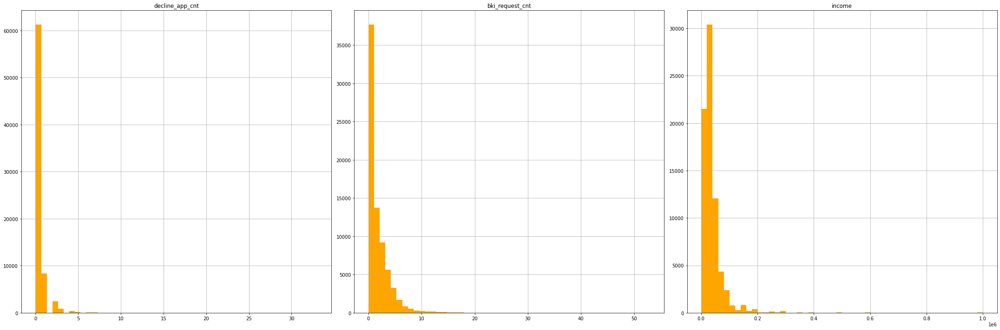

In [12]:
# Прологорифируем признаки decline_app_cnt, bki_request_cnt, income
# у decline_app_cnt, bki_request_cnt мин значение 0 поэтому прибавим 1, а у income минимальное значение 1000 

# data.decline_app_cnt = round(np.log(data.decline_app_cnt + 1),2)
# data.bki_request_cnt =  round(np.log(data.bki_request_cnt + 1),2)
# data.income =  round(np.log(data.income),2)
    
fig, axes = plt.subplots(1, 3, figsize=(30,10))
data[data.train][['decline_app_cnt', 'bki_request_cnt', 'income']].hist(ax=axes, log=False, bins=50, color='orange');
plt.tight_layout()
# Есть выбросы, но распределения выглядят уже более нормальными
data.sample(5)

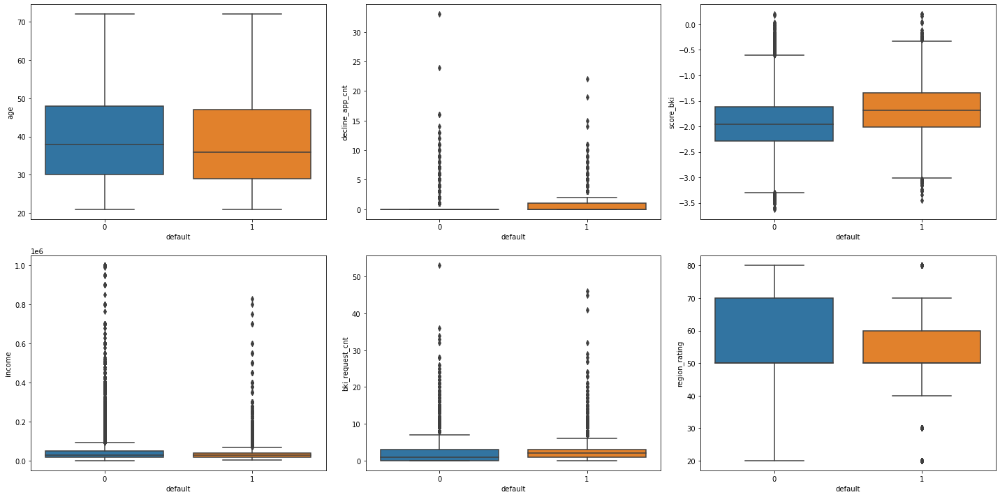

In [13]:
# Отобразим boxplot
custom_boxplot(data[data.train], num_cols, 'default', True, 3, True)
plt.tight_layout()

## Determine and delete outliers

age 3.0 75.0 21.0 66.0
decline_app_cnt 0.0 0.0 0.0 4.0
score_bki -3.299251946250001 -0.5290698762499992 -2.9524695446 -0.7015540412000003
income -22000.0 90000.0 6000.0 200000.0
bki_request_cnt -4.5 7.5 0.0 10.0
region_rating 35.0 75.0 40.0 80.0
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\ind

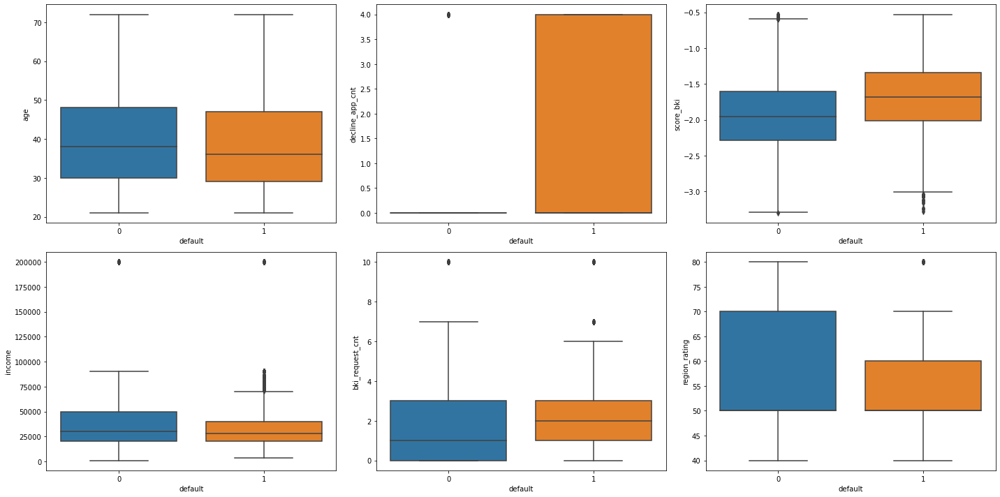

In [14]:
# Заменим выбросы минимальными и максимальными значений соответственно
outlier_replace(data, num_cols)
# Отобразим boxplot
custom_boxplot(data[data.train], num_cols, 'default', True, 3, True)
plt.tight_layout()

**Вывод:**
Многие признаки содержат большое число выбросов
- age -дефолтные клиенты в среденем младше (отличие небольшое)
- decline_app_cnt -дефолтные клиенты в среднем имеют большее количество отмененных заявок
- score_bki - посмотреть потом (!!!! люди, которые не работают, имеют более высокий балл.)
- income - дефолтные клиенты имеют в среденм более низкий доход (отличие небольшое)
- bki_request_cnt -дефолтовые клиенты в среднем делают больше запросов в BKI(!!!Запросы BKI выше у людей, не выполняющих дефолт. )
- region_rating - не влияет на дефолт клиента

## Categorical features

In [15]:
# Заменим пропуски с помощью наивного байесовского классификатора MultinomialNB. То есть обучим эту модель с целью прогнозирования значений в пропусках.
# Но учитывая, что пропусков там всего 0,41% от всех значений, можно заменить просто модой.

display(data.education.value_counts(dropna=False))
# num_cols = ['age', 'decline_app_cnt', 'bki_request_cnt',
#            'income', 'score_bki', 'region_rating']
# cat_cols = ['sex', 'home_address',
#            'work_address', 'sna', 'first_time']
# bin_cols = ['car', 'car_type', 'good_work', 'foreign_passport']

label_encoder = LabelEncoder()


columns = [x for x in data.columns if x not in ['default', 'education', 'score_bki', 'app_date', 'train']]
# for column in bin_cols:
#     data[column] = label_encoder.fit_transform(data[column])
# data = pd.get_dummies(data, columns=['sex'])
# cat_cols.remove('sex')
# bin_cols.extend(['sex_F','sex_M'])
# num_cols.remove('score_bki') # MultinomialNB не работает с отрицательными данными и не числами.

X_notna_train, y_notna_train = data[columns][data.education.notna()], data['education'][data.education.notna()]

X_isna_test = data[columns][data.education.isna()]

# display(X_notna_train.sample(5))
# display(X_isna_test.sample(5))

clf = MultinomialNB()
clf.fit(X_notna_train, y_notna_train)

predict = clf.predict(X_isna_test)

# print(predict)
data.education[data.education.isna()] = predict
data.education.value_counts(dropna=False)

SCH    57998
GRD    34768
UGR    14748
PGR     1865
NaN      478
ACD      291
Name: education, dtype: int64

<ipython-input-15-3e682b728143>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.education[data.education.isna()] = predict


SCH    58219
GRD    34834
UGR    14803
PGR     1887
ACD      405
Name: education, dtype: int64

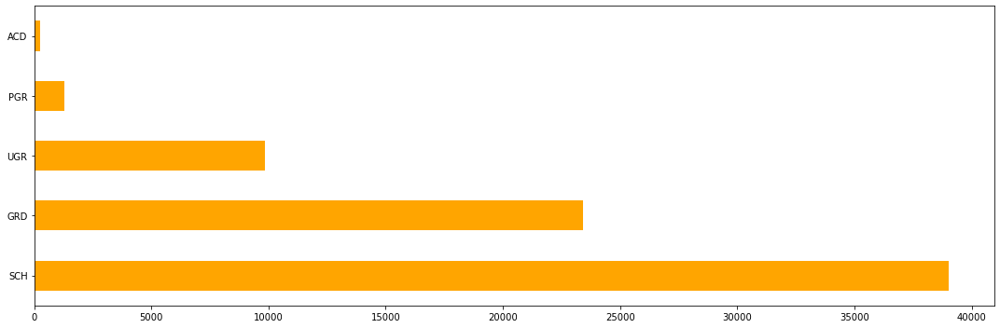

In [16]:
# Заменим пропуски в признаке education - модой
# data.education.fillna(data[data.train].education.mode()[0], inplace=True)
data[data.train].education.value_counts(dropna=False, normalize=False).plot(kind='barh', figsize=(15,5), color='orange');
plt.tight_layout()

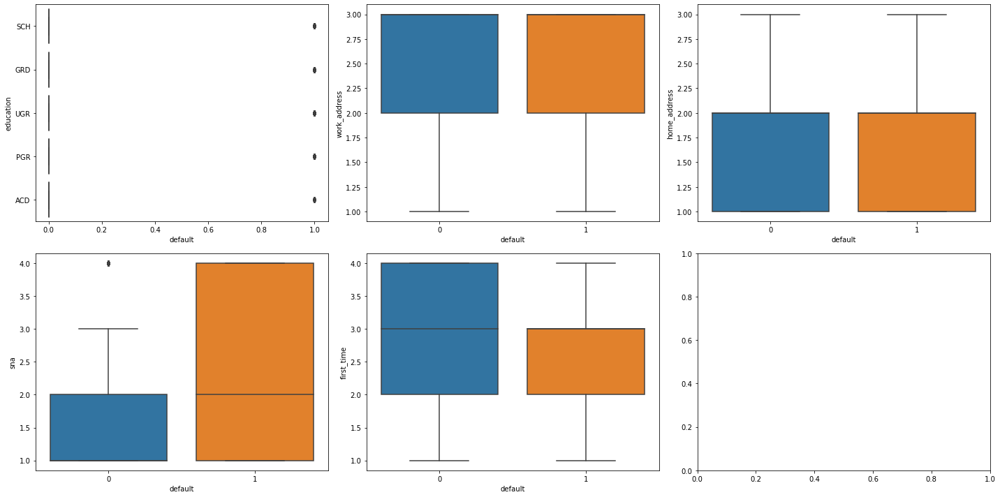

In [17]:
# Отобразим boxplot
custom_boxplot(data[data.train], cat_cols, 'default', True, 3, True)

## 'default' feature

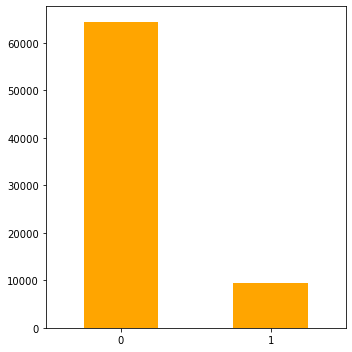

In [18]:
# Посмотрим на распределение предсказываемого признака
data[data.train].default.value_counts(normalize=False).plot(kind='bar', figsize=(5,5), color='orange', rot=0);
plt.tight_layout()

**Вывод:**
Наблюдается большой дисбаланс результирующих классов. В последствии нужно применить oversampling, т.к. если применить undersampling то каждого класса будет около 10000, что мало.

# Feature engineering

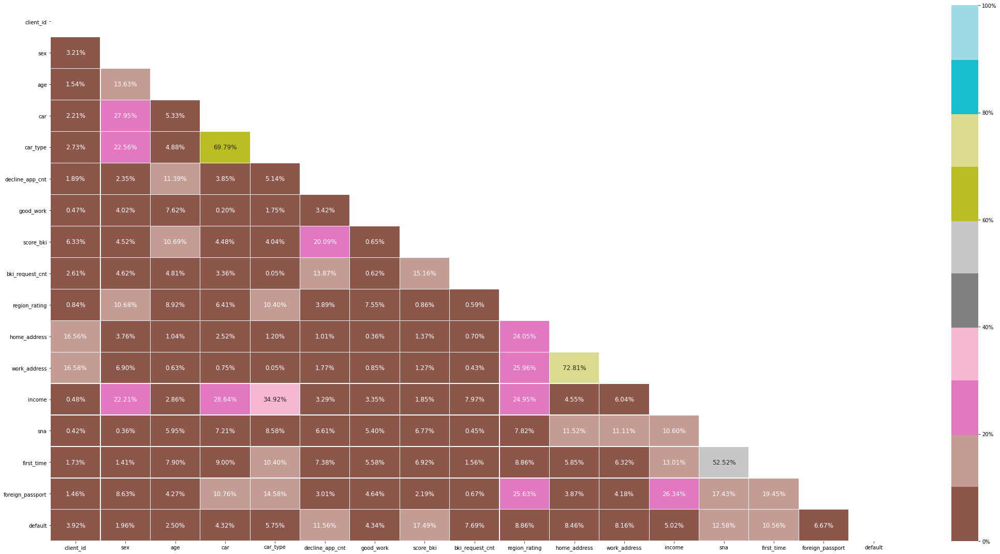

In [19]:
# Посмотрим на корреляцию Пирсона
data_fe = data.copy() #создадим копию датасета где будут новые признаки
heatmap_custom(data_fe[data_fe.train][[x for x in data_fe.columns if x not in ['train']]])

{(0, 0): 0, (1, 1): 2, (1, 0): 1}

0    74290
2    21008
1    14850
Name: car_status, dtype: int64

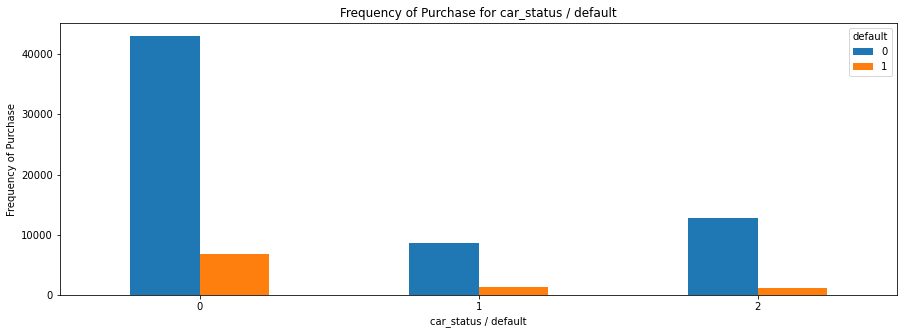

In [20]:
# Признаки car и car_type имеют очень высокую корреляцию в 70%
car_car_type_vc = data_fe[data_fe.train][['car', 'car_type']].value_counts()
# display(car_car_type_vc.to_dict())
# создадим новый признак car_status - статус автомобиля
replace_dict = car_car_type_vc.to_dict()
replace_dict[(0,0)] =0 # нет машины
replace_dict[(1,0)] =1 # отечетсвенная машина
replace_dict[(1,1)] =2 # иномарка
display(replace_dict)

data_fe['car_status'] = data_fe[['car', 'car_type']].apply(lambda x: replace_dict[x[0],x[1]],  axis=1)
display(data_fe['car_status'].value_counts())

pd.crosstab(data_fe[data_fe.train]['car_status'], data_fe[data_fe.train]['default']).\
    plot.bar(figsize=(15,5), xlabel='car_status / default', ylabel='Frequency of Purchase', title='Frequency of Purchase for car_status / default', rot=0);

# признак car_status является существенным прогнозирующим фактором


# scatter_for_two_columns_with_count(data_fe[data_fe.train],'car_status', 'default', figsize=(15,5))
# g = sns.pairplot(
#     data_fe[data_fe.train][['car_status','default']],
#     hue='default',
#     # x_vars=['education'],
#     dropna=False,
#     height=5, # высота
#     aspect=1.5, # ширина  = aspect*height
#     corner=True,
# );
# g.fig.set_size_inches(20,10)

In [21]:
# Вычислим средние категориальные значения для категориальных переменных, чтобы получить более точное представление о данных.
display(round(data_fe[data_fe.train].groupby('education').mean(),2))
display(round(data_fe[data_fe.train].groupby('work_address').mean(),2))
display(round(data_fe[data_fe.train].groupby('home_address').mean(),2))
display(round(data_fe[data_fe.train].groupby('sna').mean(),2))
display(round(data_fe[data_fe.train].groupby('first_time').mean(),2))

display(round(data_fe[data_fe.train].groupby('region_rating').mean(),2))
display(round(data_fe[data_fe.train].groupby('foreign_passport').mean(),2))

# display(round(data_fe[data_fe.train].groupby('age').mean(),2))
# display(round(data_fe[data_fe.train].groupby('decline_app_cnt').mean(),2))

,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train,car_status
education,,,,,,,,,,,,,,,,,,,
ACD,48894.20,0.58,40.85,0.50,0.36,0.38,0.38,-2.04,1.81,63.90,1.62,2.58,89134.57,1.45,3.21,0.36,0.06,True,0.86
GRD,56423.95,0.45,38.05,0.40,0.28,0.58,0.25,-1.92,2.12,58.59,1.57,2.49,58977.38,1.57,2.94,0.23,0.09,True,0.68
PGR,55529.04,0.50,38.27,0.56,0.45,0.54,0.30,-1.97,2.09,60.83,1.57,2.49,85260.77,1.44,3.08,0.32,0.07,True,1.01
SCH,53755.32,0.42,41.15,0.27,0.13,0.71,0.11,-1.91,1.94,55.30,1.57,2.49,32799.94,1.83,2.67,0.10,0.15,True,0.40
UGR,57672.68,0.46,34.87,0.32,0.18,0.83,0.17,-1.86,1.77,57.95,1.60,2.54,41578.27,1.78,2.69,0.15,0.13,True,0.50


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,income,sna,first_time,foreign_passport,default,train,car_status
work_address,,,,,,,,,,,,,,,,,,
1,47750.84,0.35,39.75,0.32,0.19,0.59,0.20,-1.92,1.99,51.94,1.04,41054.10,1.49,2.94,0.15,0.07,True,0.50
2,48037.94,0.42,39.08,0.34,0.19,0.69,0.15,-1.91,1.95,52.49,1.06,38621.24,1.62,2.78,0.12,0.10,True,0.53
3,59745.66,0.46,39.29,0.32,0.19,0.70,0.17,-1.90,1.99,59.70,1.91,45984.31,1.83,2.73,0.17,0.15,True,0.51


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,work_address,income,sna,first_time,foreign_passport,default,train,car_status
home_address,,,,,,,,,,,,,,,,,,
1,48534.15,0.42,39.15,0.34,0.20,0.66,0.17,-1.91,1.96,53.00,1.91,41019.78,1.58,2.83,0.13,0.09,True,0.53
2,60771.77,0.45,39.38,0.31,0.18,0.70,0.16,-1.90,1.99,60.05,2.96,45268.76,1.85,2.71,0.17,0.16,True,0.50
3,47253.10,0.49,39.54,0.33,0.20,0.66,0.17,-1.92,1.97,53.53,2.90,44620.60,1.83,2.68,0.12,0.12,True,0.52


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,first_time,foreign_passport,default,train,car_status
sna,,,,,,,,,,,,,,,,,,
1,55361.92,0.44,40.09,0.35,0.21,0.60,0.18,-1.93,1.97,57.59,1.55,2.46,46624.07,3.13,0.19,0.10,True,0.56
2,54166.10,0.44,37.09,0.31,0.18,0.79,0.15,-1.86,2.01,55.89,1.54,2.44,41271.40,2.48,0.14,0.15,True,0.49
3,55125.99,0.43,36.35,0.29,0.16,0.88,0.13,-1.84,1.94,55.52,1.54,2.47,37262.73,2.22,0.09,0.16,True,0.45
4,55119.50,0.43,39.01,0.26,0.12,0.84,0.13,-1.86,2.00,55.04,1.74,2.70,34383.47,1.73,0.02,0.21,True,0.38


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,foreign_passport,default,train,car_status
first_time,,,,,,,,,,,,,,,,,,
1,55679.15,0.42,38.93,0.24,0.11,0.82,0.13,-1.87,1.91,55.02,1.68,2.63,32434.91,3.04,0.03,0.19,True,0.36
2,53696.83,0.45,37.29,0.30,0.17,0.84,0.15,-1.86,1.94,56.78,1.56,2.49,41103.12,1.86,0.12,0.16,True,0.47
3,54257.72,0.44,38.99,0.34,0.20,0.67,0.17,-1.90,2.00,56.26,1.54,2.45,44171.57,1.51,0.15,0.12,True,0.54
4,57142.53,0.44,41.22,0.37,0.24,0.52,0.19,-1.97,2.00,58.97,1.58,2.49,50621.06,1.18,0.25,0.08,True,0.61


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,home_address,work_address,income,sna,first_time,foreign_passport,default,train,car_status
region_rating,,,,,,,,,,,,,,,,,,
40.0,54476.97,0.38,40.65,0.29,0.16,0.76,0.15,-1.90,1.95,1.51,2.38,34437.31,1.73,2.71,0.07,0.17,True,0.46
50.0,55258.01,0.41,39.84,0.31,0.16,0.69,0.14,-1.92,1.96,1.48,2.37,36505.16,1.80,2.71,0.10,0.14,True,0.47
60.0,55136.86,0.43,39.10,0.32,0.17,0.71,0.16,-1.92,1.99,1.57,2.46,38960.49,1.85,2.73,0.12,0.13,True,0.49
70.0,54806.18,0.51,37.42,0.36,0.26,0.66,0.19,-1.86,2.12,1.45,2.56,60591.14,1.60,2.71,0.23,0.09,True,0.61
80.0,55753.09,0.54,37.70,0.38,0.28,0.54,0.23,-1.90,1.94,1.95,2.94,66552.63,1.48,3.03,0.36,0.07,True,0.66


,client_id,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,default,train,car_status
foreign_passport,,,,,,,,,,,,,,,,,,
0,55333.19,0.42,39.49,0.30,0.17,0.70,0.16,-1.90,1.97,55.44,1.57,2.48,38474.37,1.82,2.68,0.14,True,0.47
1,54031.25,0.54,38.11,0.44,0.33,0.57,0.21,-1.93,2.01,64.68,1.62,2.56,71200.84,1.27,3.23,0.07,True,0.77


**Вывод:**<br>
- Клиенты SCH и UGR (Бакалавриат в дошкольном образовании) имеют машину ~ 30% а GRD (высшая школа) ~ 40%  PGR ACD~ 55%  
Признак education категориальный-ординальный. Его значения можно расположить в порядке возрастания следующим образом: SCH, UGR, GRD, PGR, ACD и он очень похож на порядок значений признака good_work
- Признак sna связан с first_time создадим из него полиномиальный
- В регионах с высоким рейтингом больше иномарок
- Клиенты имеющие заграничный паспорт - чаще имеют иномарку, хорошую работу, гораздо больший доход

In [22]:
# Создадим призак education_ordinal
education_ordinal_dic = { 'SCH': 1, 'UGR': 2, 'GRD': 3,'PGR': 4, 'ACD': 5 }
data_fe['education_ordinal'] = data_fe['education'].map(education_ordinal_dic)

In [23]:
# Создадим полиномиальный признак
education_good_work_mean_dic =  data_fe[data_fe.train].groupby('education')['good_work'].mean().round(2).to_dict()
display(education_good_work_mean_dic)
data_fe['education_good_work_mean'] = data_fe['education'].map(education_good_work_mean_dic)
# display(data.sample(5))

trans = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
poly_cols =['income', 'education_good_work_mean']
output_nparray = trans.fit_transform(data_fe[poly_cols])
output_df = pd.DataFrame(output_nparray, columns=trans.get_feature_names(poly_cols))

display(output_df.iloc[:,2:].sample(5))
data_fe = pd.concat([data_fe, output_df.iloc[:,2:]],  axis=1, sort=False)

{'ACD': 0.38, 'GRD': 0.25, 'PGR': 0.3, 'SCH': 0.11, 'UGR': 0.17}

,income^2,income education_good_work_mean,education_good_work_mean^2
91935,9.000000e+08,7500.0,0.0625
29103,1.936000e+09,11000.0,0.0625
15670,2.250000e+08,1650.0,0.0121
105608,1.936000e+09,4840.0,0.0121
22556,3.240000e+08,4500.0,0.0625


In [24]:
# Создадим полиномиальный признак work_address и home_address, так... попробовать
trans = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
poly_cols =['work_address', 'home_address']
output_nparray = trans.fit_transform(data_fe[poly_cols])
output_df = pd.DataFrame(output_nparray, columns=trans.get_feature_names(poly_cols))

display(output_df.iloc[:,2:].sample(5))
data_fe = pd.concat([data_fe, output_df.iloc[:,2:]],  axis=1, sort=False)
# display(round(data[data.train].groupby('work_address home_address').mean(),2))

,work_address^2,work_address home_address,home_address^2
44615,9.0,6.0,4.0
80926,9.0,6.0,4.0
41180,4.0,2.0,1.0
32148,9.0,6.0,4.0
101046,4.0,2.0,1.0


In [25]:
# Создадим полиномиальный признак work_address и home_address, так... попробовать
trans = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
poly_cols =['sna', 'first_time']
output_nparray = trans.fit_transform(data_fe[poly_cols])
output_df = pd.DataFrame(output_nparray, columns=trans.get_feature_names(poly_cols))

display(output_df.iloc[:,2:].sample(5))
data_fe = pd.concat([data_fe, output_df.iloc[:,2:]],  axis=1, sort=False)
# display(round(data[data.train].groupby('work_address home_address').mean(),2))

,sna^2,sna first_time,first_time^2
98060,4.0,2.0,1.0
37335,1.0,3.0,9.0
22472,1.0,2.0,4.0
61707,1.0,3.0,9.0
105640,16.0,4.0,1.0


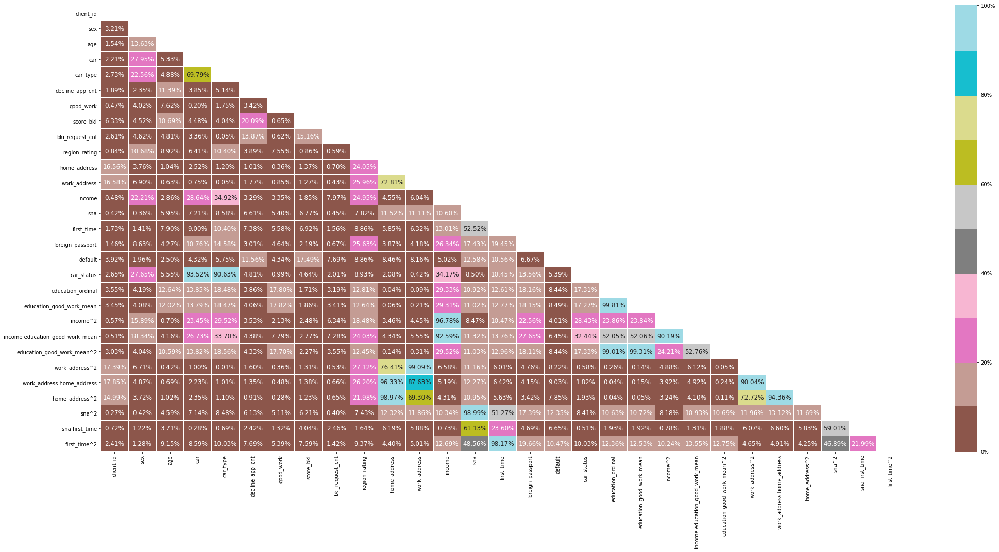

In [26]:
# Посмотрим на корреляцию Пирсона
heatmap_custom(data_fe[data_fe.train][[x for x in data_fe.columns if x not in ['train']]])

In [27]:
display(data_fe[data_fe.train].client_id.value_counts())
# client_id уникален поэтому удалим его позже

6141     1
42113    1
29467    1
19228    1
21279    1
        ..
46588    1
48637    1
42494    1
87552    1
2049     1
Name: client_id, Length: 73799, dtype: int64

In [28]:
# Признак app_date  конвертируем в тип date time
data_fe.app_date = pd.to_datetime(data_fe.app_date)

In [29]:
# Данные представлены только за первые 4 месяца 2014 год. 
# создадим признаки из дат 
# display(data.app_date.dt.year.value_counts())

data_fe['app_date_month'] = data_fe.app_date.dt.month
data_fe['app_date_day'] = data_fe.app_date.dt.day
data_fe['app_date_weekday'] = data_fe.app_date.dt.weekday
data_fe['app_date_weekend'] = (data_fe.app_date.dt.weekday >= 5).astype('int8')
max_date = data_fe[data_fe.train]['app_date'].max()
data_fe['app_date_days_ago'] = data_fe['app_date'].apply(lambda x: (max_date - x).days) # days from the first date
# data_fe['app_date_is'] data_fe.app_date.apply(lambda x : x.replace(day=1))

# display(data_fe['app_date_days_ago'].value_counts(sort=False))

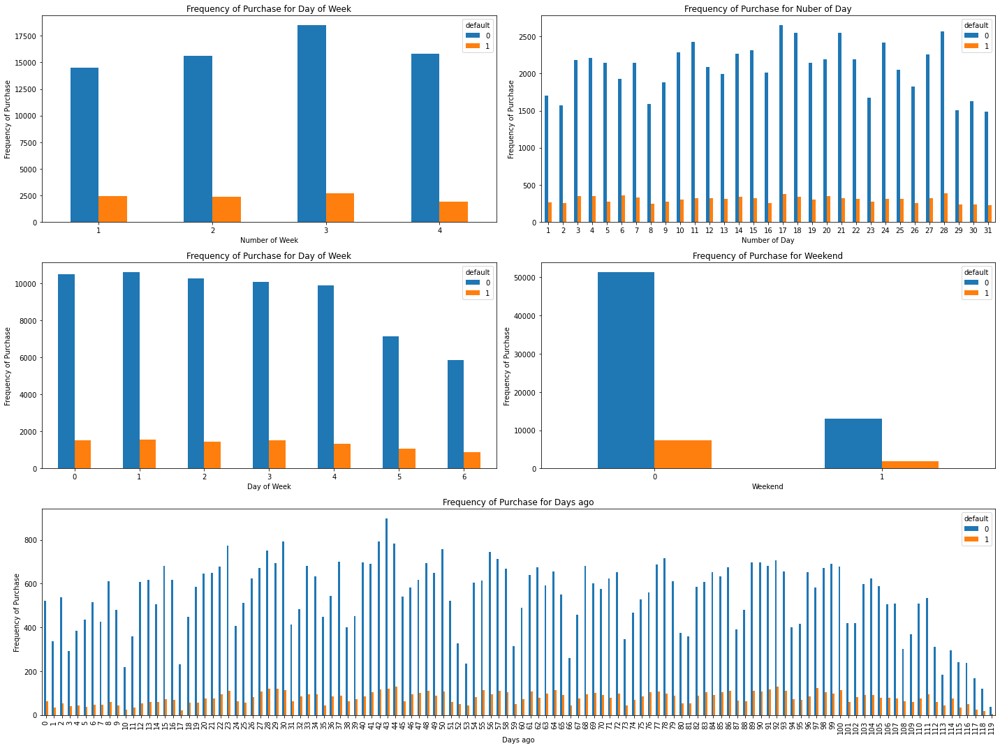

In [30]:
# Посмотрим на влияние новых признаков на целевую переменную
fig, ax = plt.subplots(3, 2, figsize=(20, 15))
default = data_fe[data_fe.train]['default']

pd.crosstab(data_fe[data_fe.train]['app_date_month'], default).\
    plot.bar(ax = ax[0,0], xlabel='Number of Week', ylabel='Frequency of Purchase', title='Frequency of Purchase for Day of Week', rot=0);

pd.crosstab(data_fe[data_fe.train]['app_date_day'], default).\
    plot.bar(ax = ax[0,1], xlabel='Number of Day', ylabel='Frequency of Purchase', title='Frequency of Purchase for Nuber of Day', rot=0);

pd.crosstab(data_fe[data_fe.train]['app_date_weekday'], default).\
    plot.bar(ax = ax[1,0], xlabel='Day of Week', ylabel='Frequency of Purchase', title='Frequency of Purchase for Day of Week', rot=0);

pd.crosstab(data_fe[data_fe.train]['app_date_weekend'], default).\
    plot.bar(ax = ax[1,1], xlabel='Weekend', ylabel='Frequency of Purchase', title='Frequency of Purchase for Weekend', rot=0);

ax1 = plt.subplot2grid((3, 2), (2, 0), colspan=2)
pd.crosstab(data_fe[data_fe.train]['app_date_days_ago'], default).\
    plot.bar(ax = ax1, xlabel='Days ago', ylabel='Frequency of Purchase', title='Frequency of Purchase for Days ago', rot=90);

plt.tight_layout()

# data_fe['app_date_days_ago'].value_counts(sort=False).sort_index().plot(kind='bar',ax = ax1, color='orange', title='давность заявки'); 

In [31]:
# Из всех признаков выше app_date_month - не является существенным прогнозирующим фактором
# удалим ненужные признаки
delete_column_if_exist(data_fe, 'app_date_month')

In [32]:
# Присвоим income рейтинг (богатые/бедные) !Пока не будем, тк соотношение очень маленькое
# rating = data_fe[data_fe.train].income.value_counts(bins=2)
# rating = rating.reset_index()
# display(rating)

# def get_income_rating(income, rating_df):
#     for rating in rating_df.iterrows():
#         if income in rating[1][0]:
# #             print(rating[0])
#             return rating[0]

# # data_fe[data_fe.train].income.hist(figsize=(15,5), color='orange');
# data_fe['income_rating'] = data_fe.income.apply(lambda x: get_income_rating(x, rating))
# data_fe['income_rating'].value_counts()

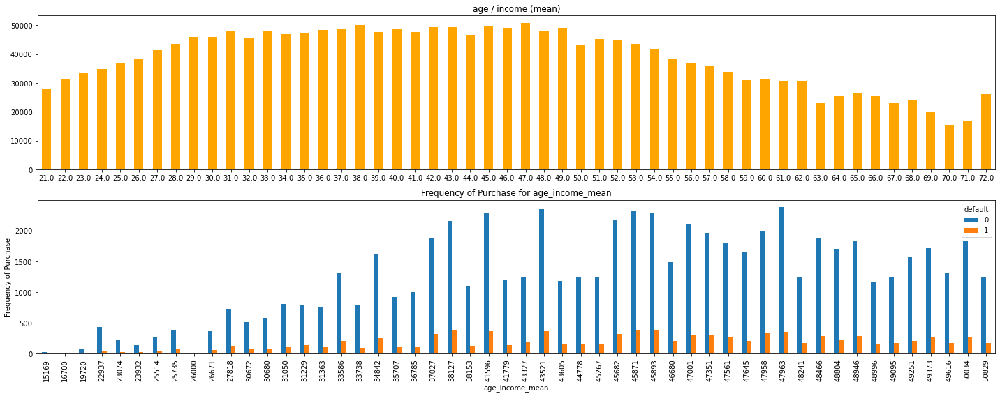

In [33]:
# Вычислим средний доход в определенном возрасте
gp_age_income_mean_dict = data_fe[data_fe.train].groupby('age').income.mean().round(0).to_dict()
# display(gp_age_income_mean_dict)
data_fe['gp_age_income_mean'] = data_fe['age'].map(gp_age_income_mean_dict).astype('int')
# display(data_fe['gp_age_income_mean'].value_counts()) 

fig, ax = plt.subplots(2, 1, figsize=(20, 8))
pd.Series(gp_age_income_mean_dict).sort_index().plot(kind='bar', ax=ax[0], color='orange', title='age / income (mean)', rot=0);
pd.crosstab(data_fe[data_fe.train]['gp_age_income_mean'], default).\
    plot.bar(ax=ax[1], xlabel='age_income_mean', ylabel='Frequency of Purchase', title='Frequency of Purchase for age_income_mean');
plt.tight_layout()

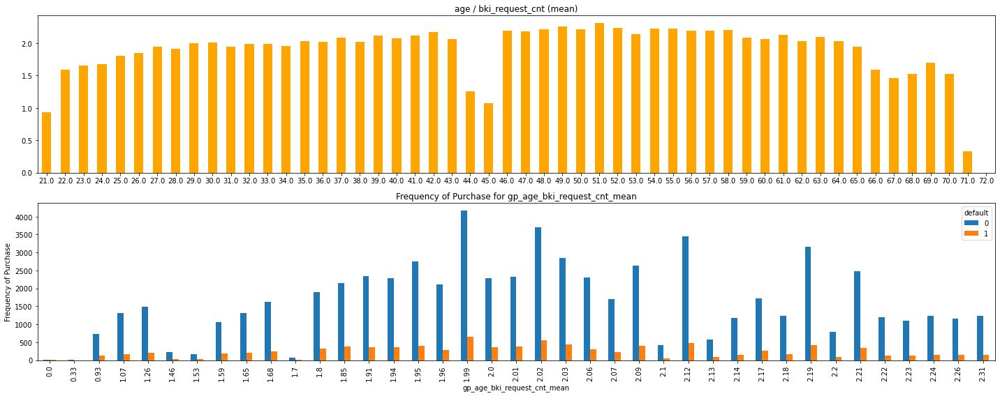

In [34]:
# Посмотрим на число запросов в БКИ в зависимости от возраста
gp_age_bki_request_cnt_mean_dict = data_fe[data_fe.train].groupby('age').bki_request_cnt.mean().round(2).to_dict()
# display(gp_age_bki_request_cnt_mean_dict)
data_fe['gp_age_bki_request_cnt_mean'] = data_fe['age'].map(gp_age_bki_request_cnt_mean_dict)
# display(data_fe['gp_age_bki_request_cnt_mean'].value_counts())

fig, ax = plt.subplots(2, 1, figsize=(20, 8))
pd.Series(gp_age_bki_request_cnt_mean_dict).sort_index().plot(kind='bar', ax=ax[0], color='orange', title='age / bki_request_cnt (mean)', rot=0);
pd.crosstab(data_fe[data_fe.train]['gp_age_bki_request_cnt_mean'], default).\
    plot.bar(ax=ax[1], xlabel='gp_age_bki_request_cnt_mean', ylabel='Frequency of Purchase', title='Frequency of Purchase for gp_age_bki_request_cnt_mean');
plt.tight_layout()

delete_column_if_exist(data_fe, 'gp_age_bki_request_cnt_mean') # выглядит не очень, пока удалим

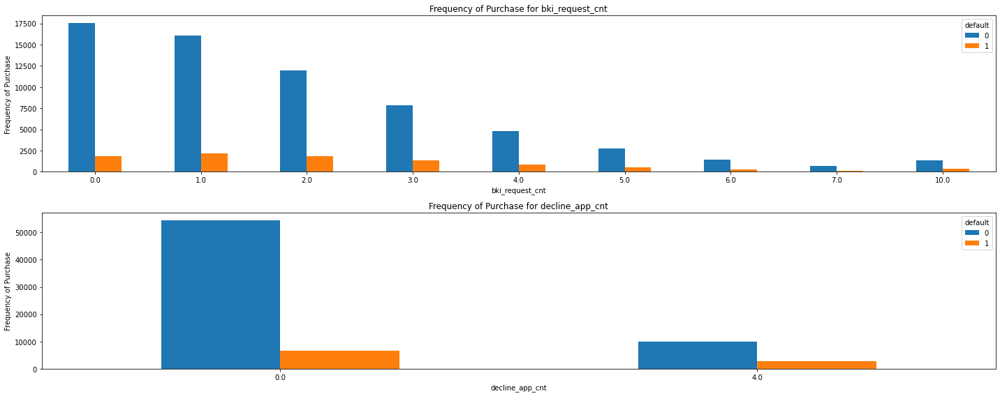

In [35]:
# !!! Позже нужно попробовать поотнимать из каждого второго
# Посмотрим на распределени двух интересных признаков bki_request_cnt и decline_app_cnt
fig, ax = plt.subplots(2, 1, figsize=(20, 8))
pd.crosstab(data_fe[data_fe.train]['bki_request_cnt'], default).\
    plot.bar(ax=ax[0], xlabel='bki_request_cnt', log=False, ylabel='Frequency of Purchase', title=f'Frequency of Purchase for bki_request_cnt', rot=0);
pd.crosstab(data_fe[data_fe.train]['decline_app_cnt'], default).\
    plot.bar(ax=ax[1], xlabel='decline_app_cnt', log=False, ylabel='Frequency of Purchase', title='Frequency of Purchase for decline_app_cnt', rot=0);
plt.tight_layout()

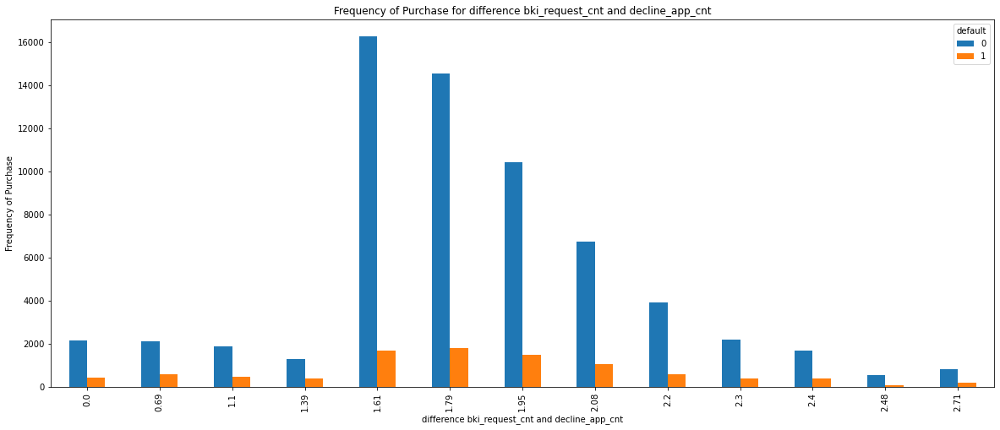

In [36]:
# Создадим новый признак difference_bki_request_and_decline
difference =data_fe['bki_request_cnt'] - data_fe['decline_app_cnt']
# difference =abs(data_fe[data_fe.train]['bki_request_cnt'] - data_fe[data_fe.train]['decline_app_cnt'])
# difference.value_counts()

min = difference.min()
difference += (-min +1)

data_fe['difference_bki_request_and_decline'] = round(np.log(difference),2)
# data_fe['difference_bki_request_and_decline'] =difference

pd.crosstab(data_fe[data_fe.train]['difference_bki_request_and_decline'], default).plot.bar(figsize=(20, 8), xlabel='difference bki_request_cnt and decline_app_cnt', 
                                          log=False, ylabel='Frequency of Purchase', title='Frequency of Purchase for difference bki_request_cnt and decline_app_cnt', rot=90);

# позже удалим признаки bki_request_cnt и decline_app_cnt

# признак difference_bki_request_and_decline является существенным прогнозирующим фактором и имеет похожее на нормально распределени

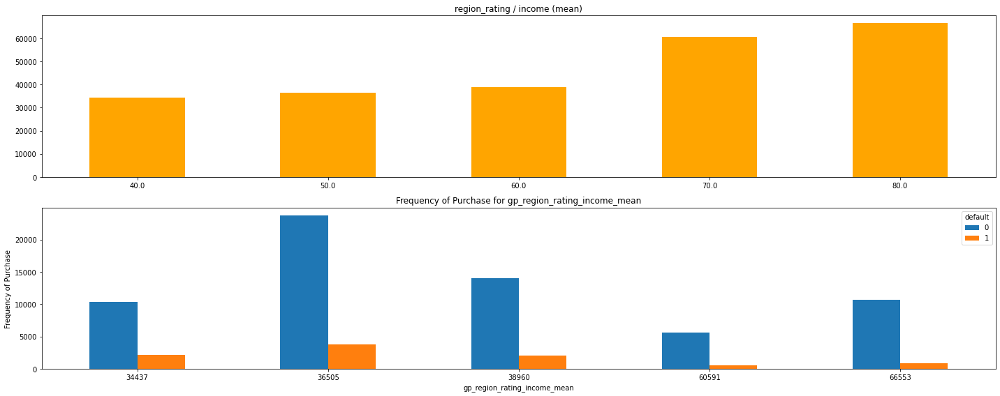

In [37]:
# Посмотрим средний доход в регионе
gp_region_rating_income_mean_dict = data_fe[data_fe.train].groupby('region_rating').income.mean().round(0).to_dict()
# display(gp_region_rating_income_mean_dict)
data_fe['gp_region_rating_income_mean'] = data_fe['region_rating'].map(gp_region_rating_income_mean_dict).astype('int')

fig, ax = plt.subplots(2, 1, figsize=(20, 8))
pd.Series(gp_region_rating_income_mean_dict).sort_index().plot(kind='bar', ax=ax[0], color='orange', title='region_rating / income (mean)', rot=0);
pd.crosstab(data_fe[data_fe.train]['gp_region_rating_income_mean'], default).\
    plot.bar(ax=ax[1], xlabel='gp_region_rating_income_mean', ylabel='Frequency of Purchase', title='Frequency of Purchase for gp_region_rating_income_mean', rot=0);
plt.tight_layout()

# признак gp_region_rating_income_mean - является существенным прогнозирующим фактором

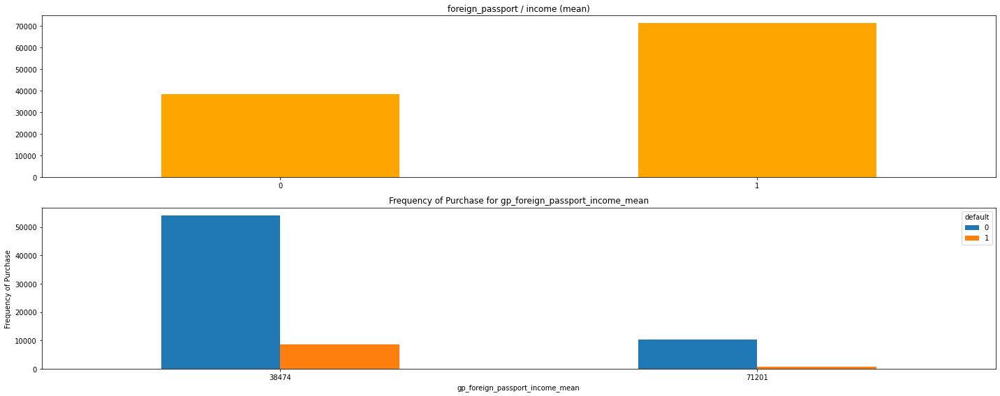

In [38]:
# Посмотрим средний доход у тех кто имеет заграничный паспорт
gp_foreign_passport_income_mean_dict = data_fe[data_fe.train].groupby('foreign_passport').income.mean().round(0).to_dict()
data_fe['gp_foreign_passport_income_mean'] = data_fe['foreign_passport'].map(gp_foreign_passport_income_mean_dict).astype('int')

fig, ax = plt.subplots(2, 1, figsize=(20, 8))
pd.Series(gp_foreign_passport_income_mean_dict).sort_index().plot(kind='bar', ax=ax[0], color='orange', title='foreign_passport / income (mean)', rot=0);
pd.crosstab(data_fe[data_fe.train]['gp_foreign_passport_income_mean'], default).\
    plot.bar(ax=ax[1], xlabel='gp_foreign_passport_income_mean', ylabel='Frequency of Purchase', title='Frequency of Purchase for gp_foreign_passport_income_mean', rot=0);
plt.tight_layout()

# признак gp_foreign_passport_income_mean - является существенным прогнозирующим фактором

In [39]:
display(data_fe.sample(5))
data_fe.info()

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train,car_status,education_ordinal,education_good_work_mean,income^2,income education_good_work_mean,education_good_work_mean^2,work_address^2,work_address home_address,home_address^2,sna^2,sna first_time,first_time^2,app_date_day,app_date_weekday,app_date_weekend,app_date_days_ago,gp_age_income_mean,difference_bki_request_and_decline,gp_region_rating_income_mean,gp_foreign_passport_income_mean
32060,34450,2014-02-11,GRD,0,34.0,0,0,0.0,0,-2.492554,0.0,60.0,1,2,20000.0,1,3,0,0,True,0,3,0.25,4.000000e+08,5000.0,0.0625,4.0,2.0,1.0,1.0,3.0,9.0,11,1,0,78,47001,1.61,38960,38474
10139,86439,2014-04-03,GRD,0,41.0,0,0,0.0,1,-0.954122,5.0,40.0,2,3,37000.0,1,1,0,1,True,0,3,0.25,1.369000e+09,9250.0,0.0625,9.0,6.0,4.0,1.0,1.0,1.0,3,3,0,27,47645,2.30,34437,38474
49009,57938,2014-03-06,SCH,1,48.0,0,0,0.0,0,-2.131373,3.0,60.0,2,3,20000.0,4,4,0,1,True,0,1,0.11,4.000000e+08,2200.0,0.0121,9.0,6.0,4.0,16.0,16.0,16.0,6,3,0,55,48241,2.08,38960,38474
55506,49528,2014-02-26,UGR,0,26.0,0,0,4.0,0,-1.005823,3.0,80.0,2,3,38000.0,4,1,0,1,True,0,2,0.17,1.444000e+09,6460.0,0.0289,9.0,6.0,4.0,16.0,4.0,1.0,26,2,0,63,38127,1.39,66553,38474
95197,7821,2014-01-15,SCH,0,35.0,0,0,0.0,1,-0.701554,2.0,80.0,2,3,30000.0,3,3,0,-1,False,0,1,0.11,9.000000e+08,3300.0,0.0121,9.0,6.0,4.0,9.0,9.0,9.0,15,2,0,105,47351,1.95,66553,38474


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 40 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   client_id                           110148 non-null  int64         
 1   app_date                            110148 non-null  datetime64[ns]
 2   education                           110148 non-null  object        
 3   sex                                 110148 non-null  int32         
 4   age                                 110148 non-null  float64       
 5   car                                 110148 non-null  int32         
 6   car_type                            110148 non-null  int32         
 7   decline_app_cnt                     110148 non-null  float64       
 8   good_work                           110148 non-null  int64         
 9   score_bki                           110148 non-null  float64       
 10  bki_requ

## Convert categorical variable into dummy

In [40]:
# категориальные
# cat_cols = ['education', 'work_address', 'home_address', 'sna', 'first_time'] 
data_fe_with_dummies = data_fe.copy()
# dummies из education делать пока не будем, тк этот признак ординальный
# data_fe_with_dummies = pd.get_dummies(data_fe, columns=['education']) #drop_first=False


In [41]:
# Заменим возможные выбросы минимальными и максимальными значений соответственно
number_features = data_fe_with_dummies.select_dtypes(include=['number']).columns
number_features = [x for x in number_features if x not in ['default']]
# outlier_replace(data_fe_with_dummies, number_features)
# # # Отобразим boxplot
# custom_boxplot(data_fe_with_dummies[data_fe_with_dummies.train], number_features, 'default', True, 3, True, figsize=(20,40))
# plt.tight_layout()

In [42]:
display(data_fe_with_dummies.sample(5))
data_fe_with_dummies.info()

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train,car_status,education_ordinal,education_good_work_mean,income^2,income education_good_work_mean,education_good_work_mean^2,work_address^2,work_address home_address,home_address^2,sna^2,sna first_time,first_time^2,app_date_day,app_date_weekday,app_date_weekend,app_date_days_ago,gp_age_income_mean,difference_bki_request_and_decline,gp_region_rating_income_mean,gp_foreign_passport_income_mean
27001,27534,2014-02-03,GRD,1,22.0,1,0,0.0,0,-1.920823,1.0,80.0,2,3,30000.0,4,4,0,0,True,1,3,0.25,9.000000e+08,7500.0,0.0625,9.0,6.0,4.0,16.0,16.0,16.0,3,0,0,86,31229,1.79,66553,38474
72055,109846,2014-04-30,SCH,1,26.0,0,0,0.0,0,-1.899872,2.0,60.0,2,3,30000.0,2,3,0,0,True,0,1,0.11,9.000000e+08,3300.0,0.0121,9.0,6.0,4.0,4.0,6.0,9.0,30,2,0,0,38127,1.95,38960,38474
75172,79589,2014-03-27,SCH,1,32.0,0,0,4.0,0,-2.885211,4.0,70.0,2,3,27000.0,4,1,0,-1,False,0,1,0.11,7.290000e+08,2970.0,0.0121,9.0,6.0,4.0,16.0,4.0,1.0,27,3,0,34,45682,1.61,60591,38474
58033,9809,2014-01-17,GRD,1,30.0,0,0,4.0,0,-1.248583,2.0,60.0,1,2,48200.0,2,4,0,0,True,0,3,0.25,2.323240e+09,12050.0,0.0625,4.0,2.0,1.0,4.0,8.0,16.0,17,4,0,103,45871,1.10,38960,38474
51688,79383,2014-03-27,GRD,1,41.0,1,1,0.0,1,-1.630627,0.0,50.0,1,2,39000.0,1,4,0,0,True,2,3,0.25,1.521000e+09,9750.0,0.0625,4.0,2.0,1.0,1.0,4.0,16.0,27,3,0,34,47645,1.61,36505,38474


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 40 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   client_id                           110148 non-null  int64         
 1   app_date                            110148 non-null  datetime64[ns]
 2   education                           110148 non-null  object        
 3   sex                                 110148 non-null  int32         
 4   age                                 110148 non-null  float64       
 5   car                                 110148 non-null  int32         
 6   car_type                            110148 non-null  int32         
 7   decline_app_cnt                     110148 non-null  float64       
 8   good_work                           110148 non-null  int64         
 9   score_bki                           110148 non-null  float64       
 10  bki_requ

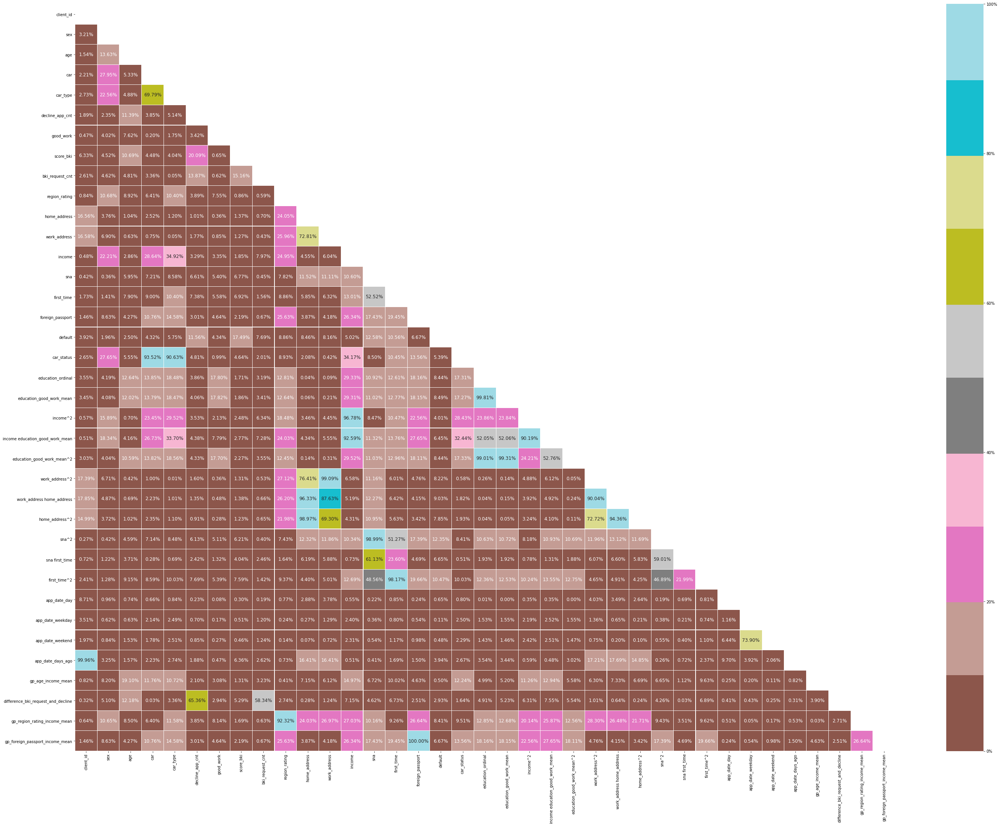

In [43]:
# Еще раз посмотрим на корреляцию Пирсона
heatmap_custom(data_fe_with_dummies[data_fe_with_dummies.train][[x for x in data_fe_with_dummies.columns if x not in ['train']]], figsize=(40,30))

In [44]:
# Удалим ненужные признаки
delete_column_if_exist(data_fe_with_dummies, 'education')

delete_column_if_exist(data_fe_with_dummies, 'client_id')
delete_column_if_exist(data_fe_with_dummies, 'app_date')

# Пока ничего не удаляем, тк сильно падает оценка
# delete_column_if_exist(data_fe_with_dummies,'car')
# delete_column_if_exist(data_fe_with_dummies,'car_type')

# delete_column_if_exist(data_fe_with_dummies,'bki_request_cnt')
# delete_column_if_exist(data_fe_with_dummies,'decline_app_cnt')
# data_fe_with_dummies.info()

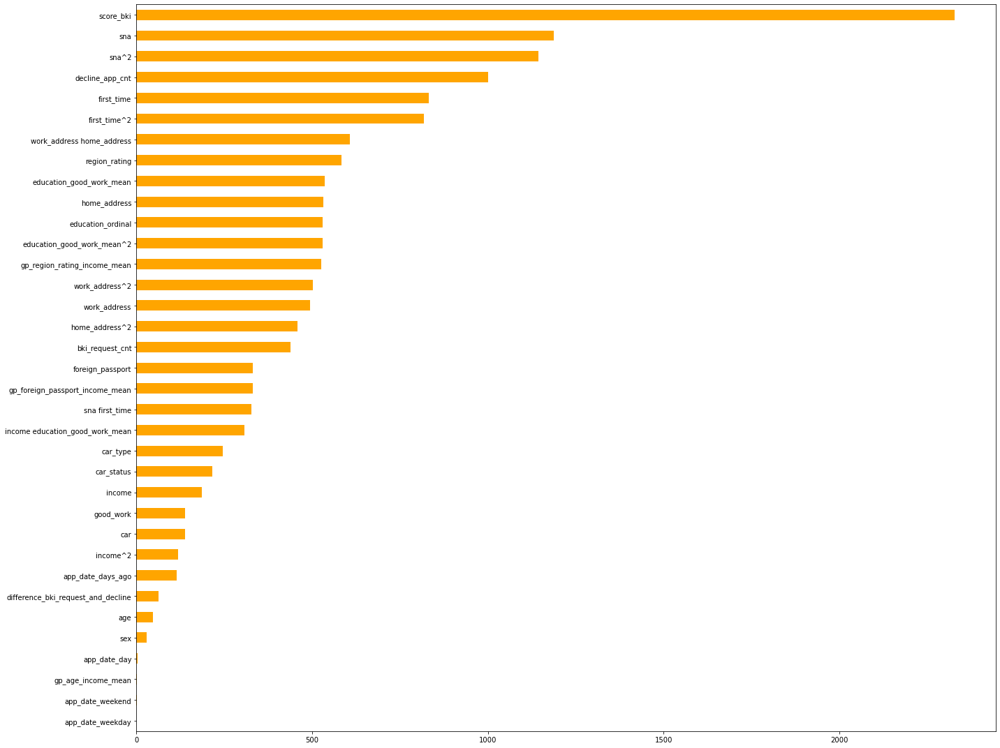

In [45]:
#  Значимость непрерывных переменных
# Для оценки значимости числовых переменных будем использовать функцию f_classif из библиотеки sklearn. 
# Возможности модуля sklearn.feature_selection могут быть использованы 
#     не только для выбора важных признаков, 
#     но и для уменьшения размерности, 
#     улучшения предсказательной силы моделей, 
#     либо для повышения их производительности на очень многомерных наборах данных.
# В основе метода оценки значимости переменных лежит однофакторный дисперсионный анализ (ANOVA). 
# Основу процедуры составляет обобщение результатов двух выборочных t-тестов для независимых выборок (2-sample t). 
# В качестве меры значимости мы будем использовать значение f-статистики. Чем значение статистики выше, 
# тем меньше вероятность того, что средние значения не отличаются, и тем важнее данный признак для нашей линейной модели.

columns=data_fe_with_dummies[data_fe_with_dummies.train].drop(['train', 'default'], axis=1).columns

imp_num = pd.Series(f_classif(data_fe_with_dummies[data_fe_with_dummies.train][columns], 
                                     data_fe_with_dummies[data_fe_with_dummies.train]['default'])[0], index = columns)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh',figsize=(20, 15), color=['orange']);
plt.tight_layout()

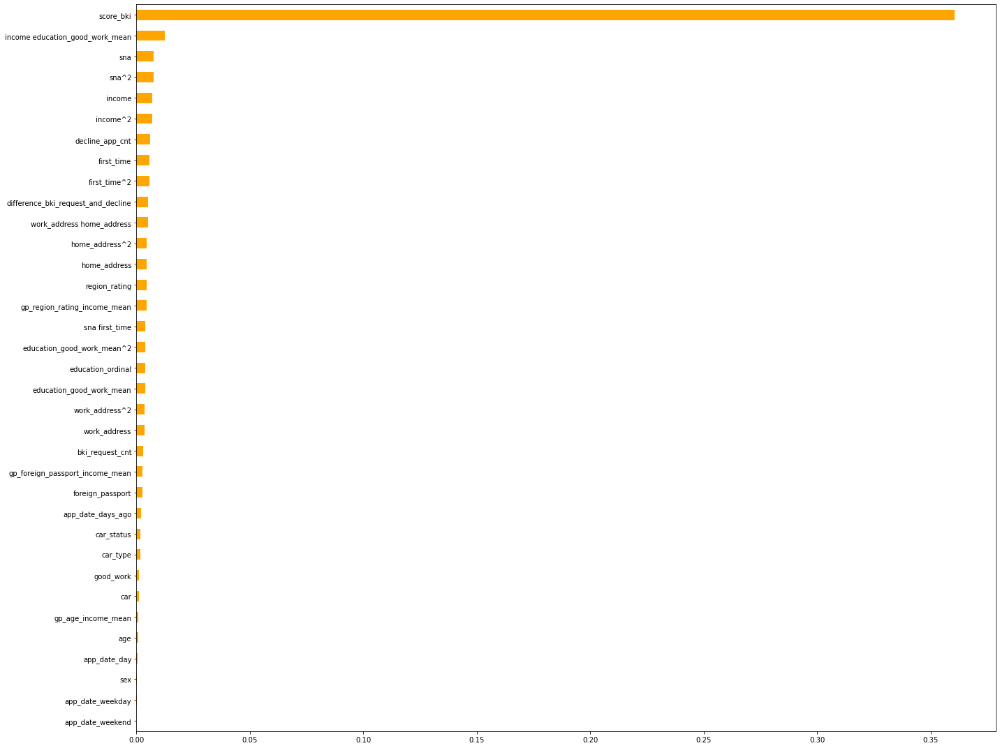

In [46]:
# Для оценки значимости категориальных и бинарных переменных будем использовать функцию mutual_info_classif из библиотеки sklearn. 
# Данная функция опирается на непараметрические методы, основанные на оценке энтропии в группах категориальных переменных.

# mutual_info_classif сначала требует, чтобы категориальные значения были сопоставлены с целочисленными значениями,
columns=data_fe_with_dummies[data_fe_with_dummies.train].drop(['train', 'default'], axis=1).columns
# display(data_fe_with_dummies.info())

imp_cat = Series(mutual_info_classif(data_fe_with_dummies[data_fe_with_dummies.train][columns], 
                                     data_fe_with_dummies[data_fe_with_dummies.train]['default'],
                                     discrete_features =True), index = columns)
imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh',figsize=(20, 15), color=['orange']);
plt.tight_layout()

## Feature ranking with recursive feature elimination (RFE)

In [47]:
# Рекурсивное устранение признаков (RFE) основывается на повторяющемся конструировании модели и 
# выборе лучше всех или хуже всех выполняемого признака, отделения этого признака и повторения цикла с оставшимися. 
# Этот процесс применяется, пока в наборе данных не закончатся признаки. 
# Цель RFE заключается в отборе признаков посредством рекурсивного рассмотрения всё меньшего и меньшего их набора.
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

is_RFE = False
if is_RFE:
    # После применение алгоритма половина признаков удалено, посмотрим как это повлияет на итоговый результат
    columns=data_fe_with_dummies[data_fe_with_dummies.train].drop(['train','default'], axis=1).columns
    print(f'List columns old (len={len(columns)}):')
    display(pd.Series(columns))

    X_rfe=data_fe_with_dummies[data_fe_with_dummies.train].drop(['train','default'], axis=1)
    y_rfe=data_fe_with_dummies[data_fe_with_dummies.train].drop(['train'], axis=1)['default']

    logreg = LogisticRegression()
    rfe = RFE(logreg,n_features_to_select=None)
    rfe = rfe.fit(X_rfe, y_rfe)
    # print(rfe.support_)
    # print(rfe.ranking_)

    columns_with_rfe=[value for (index, value) in enumerate(columns) if rfe.support_[index]]
    print(f'\nList columns with rfe (len={len(columns_with_rfe)}):')
    display(pd.Series(columns_with_rfe))
    data_fe_with_dummies = data_fe_with_dummies[[*columns_with_rfe, *['default','train']]]
    
# data_fe_with_dummies.info()

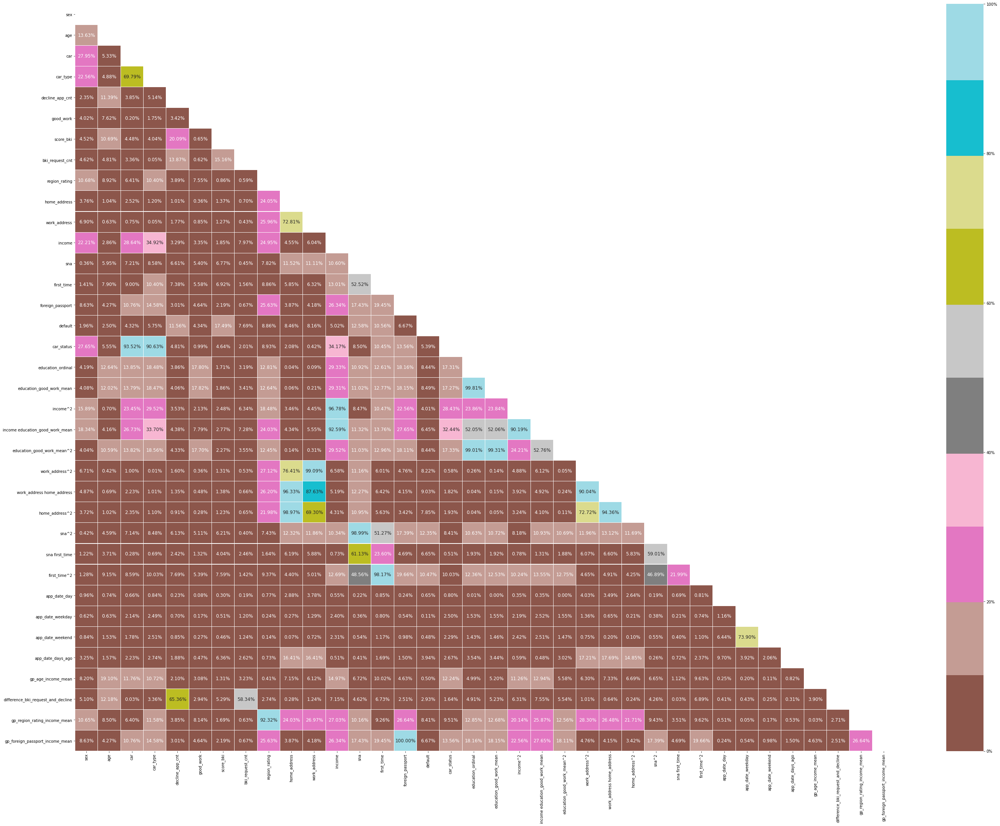

In [48]:
heatmap_custom(data_fe_with_dummies[data_fe_with_dummies.train][[x for x in data_fe_with_dummies.columns if x not in ['train']]], figsize=(40,30))
# data_fe_with_dummies.info()

# Сreate Model

In [49]:
train_df = data_fe_with_dummies[data_fe_with_dummies.train].drop(['train'], axis=1)
test_df = data_fe_with_dummies[~data_fe_with_dummies.train].drop(['train'], axis=1)
# display(train_df.info())
# display(test_df.info())

## Scaling

In [50]:
# Произведем маштабирование числовых признаков
# MinMaxScaler не искажает расстояния между значениями в каждой функции.
#согласное статье https://www.machinelearningmastery.ru/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02/

scaler = MinMaxScaler() 
#scaler = StandardScaler()
# scaler = RobustScaler()

scaler_features = train_df.select_dtypes(include=['number']).columns
scaler_features = [x for x in scaler_features if x not in ['default']]
# display(scaler_features)
# display(test_df[scaler_features].mean())

train_df[scaler_features] = scaler.fit_transform(train_df[scaler_features]) # .flatten()
test_df[scaler_features] = scaler.transform(test_df[scaler_features]) # .flatten()

In [51]:
display(train_df.sample(5))
display(test_df.sample(5))

,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,car_status,education_ordinal,education_good_work_mean,income^2,income education_good_work_mean,education_good_work_mean^2,work_address^2,work_address home_address,home_address^2,sna^2,sna first_time,first_time^2,app_date_day,app_date_weekday,app_date_weekend,app_date_days_ago,gp_age_income_mean,difference_bki_request_and_decline,gp_region_rating_income_mean,gp_foreign_passport_income_mean
20005,1.0,0.705882,0.0,0.0,0.0,0.0,0.467841,0.0,0.25,0.0,0.5,0.120603,0.0,0.333333,0.0,0,0.0,0.0,0.000000,0.015600,0.034787,0.000000,0.375,0.125,0.000,0.0,0.066667,0.200000,0.166667,0.500000,0.0,0.462185,0.575939,0.594096,0.064392,0.0
30877,1.0,0.294118,1.0,1.0,0.0,0.0,0.344710,0.2,0.00,0.0,0.5,1.000000,0.0,0.333333,1.0,0,1.0,0.5,0.518519,1.000000,0.657399,0.380952,0.375,0.125,0.000,0.0,0.066667,0.200000,0.233333,0.833333,1.0,0.680672,0.933735,0.719557,0.000000,1.0
46263,1.0,0.058824,1.0,0.0,0.0,0.0,0.570952,0.3,0.75,0.0,0.0,1.000000,0.0,0.333333,1.0,0,0.5,0.5,0.518519,1.000000,0.657399,0.380952,0.000,0.000,0.000,0.0,0.066667,0.200000,0.833333,0.333333,0.0,0.529412,0.551683,0.767528,0.814360,1.0
60220,0.0,0.137255,0.0,0.0,0.0,0.0,0.771151,0.7,1.00,0.5,1.0,0.195980,0.0,0.666667,0.0,1,0.0,0.5,0.518519,0.039976,0.130320,0.380952,1.000,0.625,0.375,0.0,0.133333,0.533333,0.366667,0.333333,0.0,0.411765,0.795064,0.915129,1.000000,0.0
29870,1.0,0.215686,0.0,0.0,1.0,0.0,0.755335,0.4,0.25,0.5,1.0,0.145729,0.0,0.666667,0.0,0,0.0,0.5,0.518519,0.022476,0.097378,0.380952,1.000,0.625,0.375,0.0,0.133333,0.533333,0.066667,0.500000,0.0,0.226891,0.855665,0.594096,0.064392,0.0


,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,car_status,education_ordinal,education_good_work_mean,income^2,income education_good_work_mean,education_good_work_mean^2,work_address^2,work_address home_address,home_address^2,sna^2,sna first_time,first_time^2,app_date_day,app_date_weekday,app_date_weekend,app_date_days_ago,gp_age_income_mean,difference_bki_request_and_decline,gp_region_rating_income_mean,gp_foreign_passport_income_mean
85251,0.0,0.568627,0.0,0.0,0.0,0.0,0.294274,0.0,0.00,0.5,1.0,0.145729,1.0,0.000000,0.0,-1,0.0,0.50,0.518519,0.022476,0.097378,0.380952,1.000,0.625,0.375,1.0,0.200000,0.000000,0.333333,0.166667,0.0,0.655462,0.789624,0.594096,0.000000,0.0
80934,0.0,0.294118,0.0,0.0,0.0,0.0,0.589016,0.3,1.00,0.5,1.0,0.221106,0.0,1.000000,0.0,-1,0.0,0.25,0.222222,0.050601,0.099354,0.126984,1.000,0.625,0.375,0.0,0.200000,1.000000,0.300000,0.500000,0.0,0.168067,0.933735,0.767528,1.000000,0.0
89193,1.0,0.039216,1.0,0.0,0.0,0.0,0.743950,0.1,0.25,0.0,0.5,0.221106,0.0,0.666667,0.0,-1,0.5,0.50,0.518519,0.050601,0.146791,0.380952,0.375,0.125,0.000,0.0,0.133333,0.533333,0.033333,1.000000,1.0,0.495798,0.516461,0.660517,0.064392,0.0
97763,1.0,0.901961,0.0,0.0,1.0,0.0,0.330086,0.2,0.25,0.5,1.0,0.075377,0.0,0.666667,0.0,-1,0.0,0.00,0.000000,0.006375,0.021742,0.000000,1.000,0.625,0.375,0.0,0.133333,0.533333,0.300000,0.500000,0.0,0.168067,0.221677,0.405904,0.064392,0.0
92486,0.0,0.294118,0.0,0.0,0.0,0.0,0.698870,0.1,0.25,0.0,0.5,0.120603,0.0,0.666667,0.0,-1,0.0,0.00,0.000000,0.015600,0.034787,0.000000,0.375,0.125,0.000,0.0,0.133333,0.533333,0.300000,0.000000,0.0,0.663866,0.933735,0.660517,0.064392,0.0


In [52]:
X = train_df.drop(['default'], axis=1)
y = train_df['default'] # <--- target

In [53]:
import statsmodels.api as sm
logit_model=sm.Logit(train_df['default'],train_df.drop(['default'], axis=1))
result=logit_model.fit()
print(result.summary2())

# p-значения для большинства переменных меньше 0.05, за исключением всего четырёх, следовательно мы их удалим.

Optimization terminated successfully.
         Current function value: 0.345569
         Iterations 7
                                          Results: Logit
Model:                         Logit                       Pseudo R-squared:            0.092     
Dependent Variable:            default                     AIC:                         51071.3530
Date:                          2021-06-13 13:39            BIC:                         51375.2533
No. Observations:              73799                       Log-Likelihood:              -25503.   
Df Model:                      32                          LL-Null:                     -28090.   
Df Residuals:                  73766                       LLR p-value:                 0.0000    
Converged:                     1.0000                      Scale:                       1.0000    
No. Iterations:                7.0000                                                             
-------------------------------------------------

## Random Oversampling and Undersampling

Counter({0: 64427, 1: 9372})


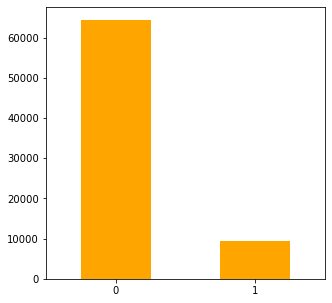

In [54]:
# https://towardsdatascience.com/oversampling-and-undersampling-5e2bbaf56dcf
# Посмотрим на распределение предсказываемого признака
pd.Series(y).value_counts().plot.bar(figsize=(5,5), color='orange', rot=0);
# plt.tight_layout()
print(Counter(y))

In [55]:
def setSampling(X, y, typeSampling=4):
    '''Применяет одну из разновидностей семплинга для уменьшения дисбаланса классов'''
    X_sampled = None 
    y_sampled = None

    if typeSampling == 1:
        X_ros, y_ros = RandomOverSampler().fit_resample(X, y)
        print(Counter(y_ros))
        X_sampled, y_sampled = X_ros, y_ros
        
    elif typeSampling == 2: 
        # Random Undersampling
        X_rus, y_rus = RandomUnderSampler().fit_resample(X, y)
        print(Counter(y_rus))
        X_sampled, y_sampled = X_rus, y_rus

    elif typeSampling == 3: 
        # Combined Random Sampling
        # instantiating over and under sampler
        over = RandomOverSampler(sampling_strategy=0.5)
        under = RandomUnderSampler(sampling_strategy=0.8)

        # first performing oversampling to minority class
        X_over, y_over = over.fit_resample(X, y)
        print(f"Oversampled: {Counter(y_over)}")

        # now to comine under sampling 
        X_combined_sampling, y_combined_sampling = under.fit_resample(X_over, y_over)
        print(f"Combined Random Sampling: {Counter(y_combined_sampling)}")
        X_sampled, y_sampled = X_combined_sampling, y_combined_sampling
        
    elif typeSampling == 4: # Over-Sampling при помощи SMOTE
         # Алгоритм SMOTE (синтетическая техника дублирования примеров миноритарного класса)
         # 1) создаёт синтетические образцы на основе выборок минорного класса (не подписавшихся) вместо создания их копий;
         # 2) случайно выбирает одного из ближайших k-соседей и использует его для создания схожих, но случайно изменённых новых сведений.

        from imblearn.over_sampling import SMOTE
        os = SMOTE(random_state=0)

        os_data_X, os_data_y = os.fit_resample(X, y)
        X_sampled, y_sampled = os_data_X, os_data_y
    else:
         X_sampled, y_sampled = X, y
    
    return X_sampled, y_sampled

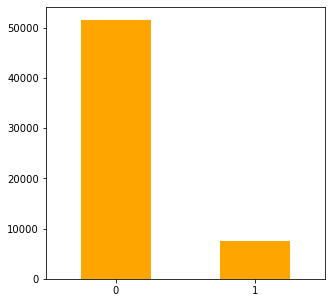

In [56]:
RANDOM_SEED = 100

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.20, random_state=RANDOM_SEED)

# Применим сэмплинг только к обучающей выборке
X_train, y_train = setSampling(X_train, y_train, typeSampling = 5)
pd.Series(y_train).value_counts().plot.bar(figsize=(5,5), color='orange', rot=0);


# Сравниетельный анализ алгоритмов классификации

In [57]:
# флаг для отключения вычисления других алгоритмов (для скорости)
execute_оther_algorithms = True

LR: 0.735 (0.004)
LDA: 0.734 (0.004)
KNNC: 0.605 (0.004)
DTC: 0.542 (0.002)
RFC: 0.703 (0.003)
NB: 0.680 (0.003)


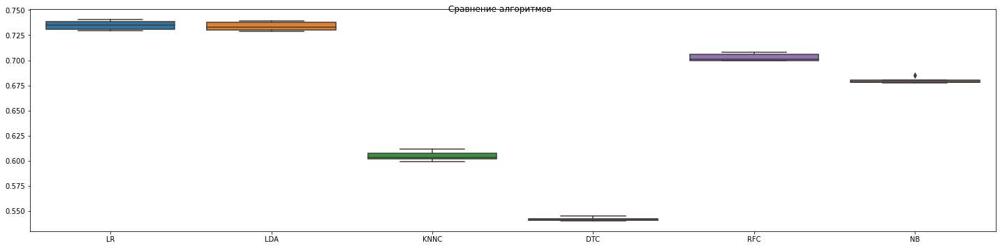

In [76]:
# Проведем предворительный анализ основных алгоритмов классификации 5-кратной перекрестной проверкой и построим для низ boxplot
if execute_оther_algorithms:
    models = []
    models.append(('LR', LogisticRegression())) # Логистическая регрессия
    models.append(('LDA', LinearDiscriminantAnalysis())) # Линейный Дискриминантный Анализ
    models.append(('KNNC', KNeighborsClassifier())) # K-Ближайших соседи
    models.append(('DTC', DecisionTreeClassifier())) # Решающие деревья
    models.append(('RFC', RandomForestClassifier()))
    models.append(('NB', GaussianNB())) # Наивный байесовский
    # models.append(('SVM', SVC())) # Опорные векторные машины (алгоритм не выдает результат. прождал 30 мин)

    # оценим каждую модель по очереди используя KFold разбиение
    results = []
    names = []

    for name, model in models:

        kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        cv_results = model_selection.cross_val_score(model, X, y, cv=kfold, scoring='roc_auc')    

        results.append(cv_results)
        names.append(name)

        msg = f"{name}: {cv_results.mean():0.3f} ({cv_results.std():.3f})"
        print(msg)


    # строим boxplot
    fig, ax = plt.subplots(figsize=(20, 5), tight_layout = True)
    fig.suptitle('Сравнение алгоритмов');
    sns.boxplot(data=results);
    ax.set_xticklabels(names);
    plt.tight_layout()

### Вывод
Исходя из этих результатов, можно предположить, что как логистическая регрессия, так и линейный дискриминационный анализ, показывают в среднем лучшие результаты. Главное при сравнении не не балансировать выборку, так как тогда другие алгоритмы покажут ложно более лучший результат!

## Logistic Regression model with hold-out

Best roc_auc: 0.734, with best C: {'C': 7.742636826811269, 'penalty': 'l2', 'solver': 'lbfgs'}
Best model: LogisticRegression(C=7.742636826811269, class_weight='balanced',
                   multi_class='ovr', random_state=100)


[2021-06-13 13:56:11 - Logistic Regression with CV hyperparameter tuning and split hold-out]
roc_auc: 0.739 | f1: 0.343 | recall: 0.675 | precision: 0.23 | accuracy: 0.667
confusion_matrix:
[[8557 4299]
 [ 618 1286]]


<Figure size 432x288 with 0 Axes>

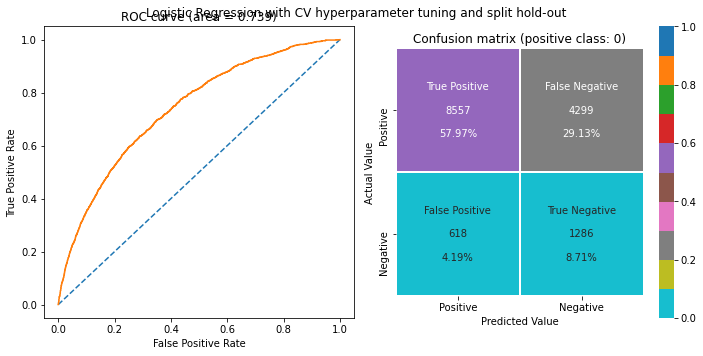

In [75]:
# Попробуем подобрать лучшие параметры для LG с помощью  GridSearchCV
param = [
#     {
#     'C': np.logspace(0, 4, 10), 
#     'penalty': ['l1'], 
#     'solver': ['liblinear'], 
#     }, 
    {
    'C': np.logspace(0, 4, 10), 
    'penalty': ['l2'], 
    'solver': ['lbfgs'], 
    },
#     {
#         'penalty': ['none']
#     }
     ]
log_reg = LogisticRegression(max_iter = 100, random_state=RANDOM_SEED, class_weight='balanced', multi_class='ovr')

# RandomizedSearchCV пробовать не буду, тк параметров не очень много
clf = GridSearchCV(log_reg, param, scoring='roc_auc', refit=True, cv=5)
clf.fit(X_train, y_train)
best_model = clf.best_estimator_
print(f'Best roc_auc: {clf.best_score_:.3}, with best C: {clf.best_params_}')
print(f"Best model: {best_model}\n\n")

# Посмотрим на оценку модели с подобранными гиперпараметрами
display_metrics_awesome(best_model, X_valid, y_valid, 'Logistic Regression with CV hyperparameter tuning and split hold-out')

## Вывод:
Из матрицы видно что мы хорошо определяем не дефолтных клиентов и очень плохо дефолтных

## Logistic Regression model with cross-validator StratifiedKFold

Best score: 0.739, with best C: {'Cs': 10, 'class_weight': 'balanced', 'cv': 5, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1.0, 'l1_ratios': None, 'max_iter': 100, 'multi_class': 'ovr', 'n_jobs': None, 'penalty': 'l2', 'random_state': 100, 'refit': True, 'scoring': 'roc_auc', 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0}
Best model: LogisticRegressionCV(class_weight='balanced', cv=5, multi_class='ovr',
                     random_state=100, scoring='roc_auc')


[2021-06-13 13:45:28 - Logistic Regression with CV hyperparameter tuning and split StratifiedKFold]
roc_auc: 0.739 | f1: 0.344 | recall: 0.676 | precision: 0.231 | accuracy: 0.667
confusion_matrix:
[[8559 4297]
 [ 616 1288]]


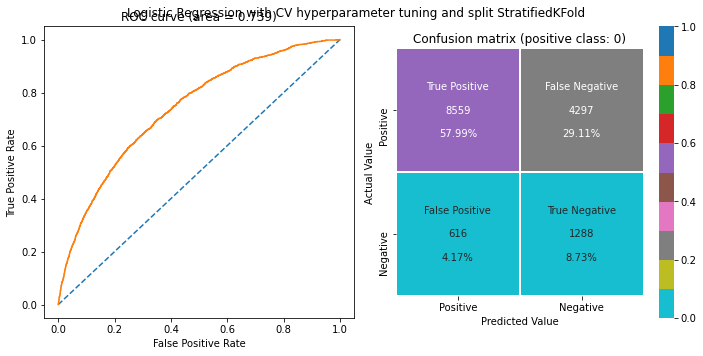

In [60]:
if execute_оther_algorithms:
    # Попробуем LogisticRegressionCV с втроенной кросс-валидацией (по умолчанию StratifiedKFold)
    log_reg_cv = LogisticRegressionCV(cv=5, max_iter = 100, random_state=RANDOM_SEED, scoring ='roc_auc', 
                                   solver='lbfgs', penalty='l2', class_weight='balanced', multi_class='ovr')
    log_reg_cv.fit(X_train, y_train)

    print(f'Best score: {log_reg_cv.score(X_valid, y_valid):.3}, with best C: {log_reg_cv.get_params(deep=True)}')
    print(f"Best model: {log_reg_cv}\n\n")
    # Посмотрим на оценку модели с подобранными гиперпараметрами
    display_metrics_awesome(log_reg_cv, X_valid, y_valid, 'Logistic Regression with CV hyperparameter tuning and split StratifiedKFold')

## Linear Discriminant Analysis

Best score: 0.871, with best C: {'n_components': None, 'priors': None, 'shrinkage': None, 'solver': 'svd', 'store_covariance': False, 'tol': 0.0001}
Best model: LinearDiscriminantAnalysis()


[2021-06-13 13:45:29 - Linear Discriminant Analysis]
roc_auc: 0.738 | f1: 0.079 | recall: 0.043 | precision: 0.488 | accuracy: 0.871
confusion_matrix:
[[12770    86]
 [ 1822    82]]


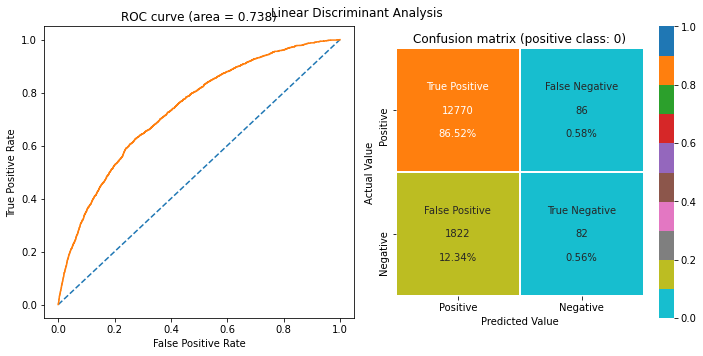

In [61]:
if execute_оther_algorithms:
    LDA = LinearDiscriminantAnalysis()
    LDA.fit(X_train, y_train)

    print(f'Best score: {LDA.score(X_valid, y_valid):.3}, with best C: {LDA.get_params(deep=True)}')
    print(f"Best model: {LDA}\n\n")
    # Посмотрим на оценку модели с подобранными гиперпараметрами
    display_metrics_awesome(LDA, X_valid, y_valid, 'Linear Discriminant Analysis')

# Попробуем дополнитльные модели классификации

## Cat Boost Classifier

[2021-06-13 13:46:41 - CatBoost]
roc_auc: 0.74 | f1: 0.345 | recall: 0.677 | precision: 0.231 | accuracy: 0.668
confusion_matrix:
[[8573 4283]
 [ 615 1289]]


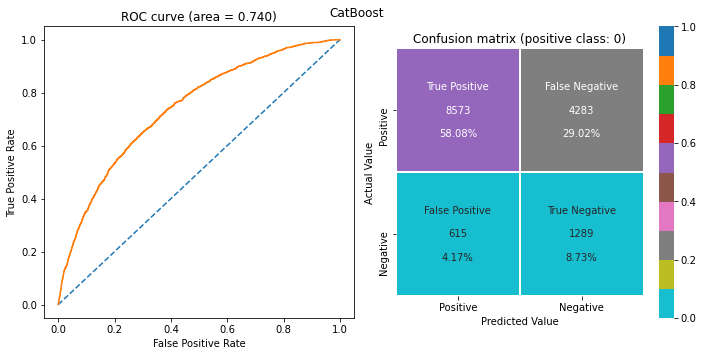

In [62]:
if execute_оther_algorithms:
    catbst = CatBoostClassifier(
                               iterations=500,
                               metric_period=100,
                               random_seed=RANDOM_SEED,
                               depth=6,
                               l2_leaf_reg=5,
                               eval_metric='AUC',
                               custom_loss=['AUC', 'Accuracy'],
                               use_best_model=True,
                               auto_class_weights='Balanced',
                               early_stopping_rounds=20,
                               learning_rate=0.01591,
                               boosting_type='Ordered',
                               bootstrap_type='MVS',
                               leaf_estimation_method='Newton'
                               )

    train_pool = Pool(X_train, label=y_train)
    test_pool = Pool(X_valid,y_valid)

    catbst.fit(train_pool, eval_set=test_pool, use_best_model=True, verbose_eval=False)
    display_metrics_awesome(catbst, X_valid, y_valid, 'CatBoost')

## LGBM
https://habr.com/ru/company/skillfactory/blog/530594/

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=20, subsample_freq=0 will be ignored. Current value: bagging_freq=20
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=20, subsample_freq=0 will be ignored. Current value: bagging_freq=20
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=20, subsample_freq=0 will be ignored. Current value: bagging_freq=20
[LightGBM] [Warning] Find whitespaces

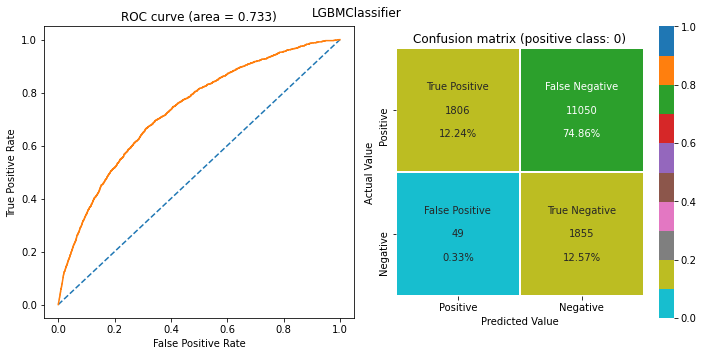

In [63]:
# LGBM
if execute_оther_algorithms:
    lgbm = lightgbm.LGBMClassifier(application='binary',
                                objective='binary',
                                metric='auc',
                                is_unbalance='true',
                                boosting='gbdt',
                                num_leaves=40,
                                bagging_freq=20,
                                learning_rate=0.05,
                                verbose=0,
                                class_weight='balanced',
                                random_state = RANDOM_SEED)

    lgbm.fit(X=X_train, y=y_train,
                   eval_set=(X_valid, y_valid),
                   #num_boost_round=5000,
                   early_stopping_rounds=50, verbose=0)
    display_metrics_awesome(lgbm, X_valid, y_valid, 'LGBMClassifier')

## XGBoost

[13:46:46] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:46:52] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[2021-06-13 13:46:56 - XGBClassifier]
roc_auc: 0.722 | f1: 0.001 | recall: 0.001 | precision: 1.0 | accuracy: 0.871
confusion_matrix:
[[12856     0]
 [ 1903     1]]


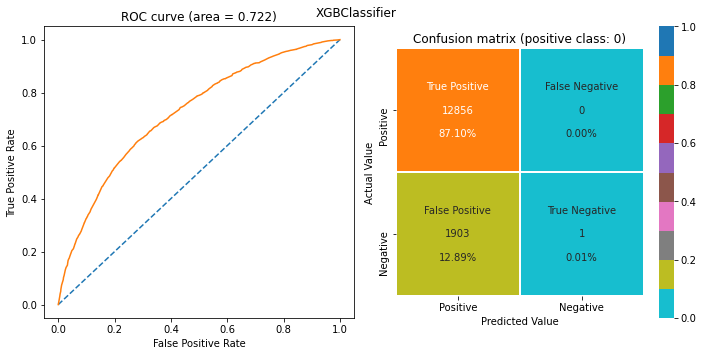

In [64]:
# https://xgboost.readthedocs.io/en/latest/
if execute_оther_algorithms:
    xgboost = XGBClassifier(learning_rate=0.02, 
                        n_estimators=60,
                        objective='binary:logistic',
                        max_depth=5,
                        gamma=5,
                        min_child_weight=5,
                        colsample_bytree=1.0,
                        subsample=1.0,
                        silent=True, nthread=1)

    clf = CalibratedClassifierCV(xgboost, method='isotonic', cv=2)
    xgboost_model = clf.fit(X_train, y_train)

    display_metrics_awesome(xgboost_model, X_valid, y_valid, 'XGBClassifier')

## RandomForestClassifier with cross-validator RandomizedSearchCV

Best score: 0.871, with best C: {'cv': 5, 'error_score': nan, 'estimator__bootstrap': True, 'estimator__ccp_alpha': 0.0, 'estimator__class_weight': None, 'estimator__criterion': 'gini', 'estimator__max_depth': None, 'estimator__max_features': 'auto', 'estimator__max_leaf_nodes': None, 'estimator__max_samples': None, 'estimator__min_impurity_decrease': 0.0, 'estimator__min_impurity_split': None, 'estimator__min_samples_leaf': 1, 'estimator__min_samples_split': 2, 'estimator__min_weight_fraction_leaf': 0.0, 'estimator__n_estimators': 100, 'estimator__n_jobs': None, 'estimator__oob_score': False, 'estimator__random_state': None, 'estimator__verbose': 0, 'estimator__warm_start': False, 'estimator': RandomForestClassifier(), 'iid': 'deprecated', 'n_iter': 5, 'n_jobs': None, 'param_distributions': {'max_depth': [6, 9, None], 'n_estimators': [50, 70, 100, 150], 'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001D48B845430>, 'criterion': ['gini', 'entropy'], 'bootst

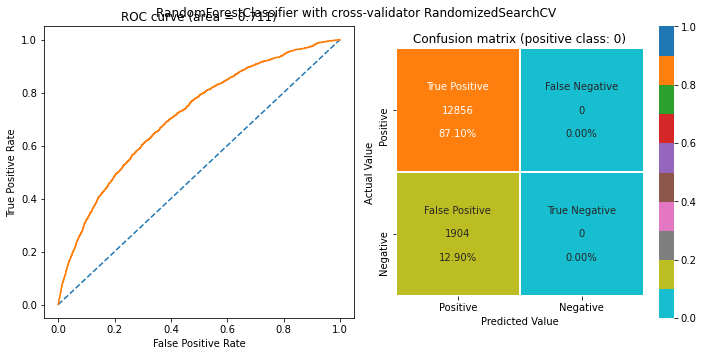

In [65]:
if execute_оther_algorithms:
    param = {
        'max_depth': [6,9, None],
        'n_estimators':[50, 70, 100, 150], 
        'max_features': randint(1,6), 
        'criterion' : ['gini', 'entropy'],
        'bootstrap':[True, False], 
    #     'mln_samples_leaf': randint(1,4)
    }


    rnd_search = RandomizedSearchCV(RandomForestClassifier(), param, n_iter =5, cv=5)
    rnd_search.fit(X_train,y_train)
    print(f'Best score: {rnd_search.score(X_valid, y_valid):.3}, with best C: {rnd_search.get_params(deep=True)}')
    print(f"Best model: {rnd_search}\n\n")

    display_metrics_awesome(rnd_search, X_valid, y_valid, 'RandomForestClassifier with cross-validator RandomizedSearchCV')

In [67]:
# import os
# os.remove("/kaggle/working/submission.csv")

test_data = test_df.drop(['default'], axis=1)

y_test_pred_proba = best_model.predict_proba(test_data)
display(y_test_pred_proba[:,1])
# !!! Округлять не стоит результат плохой!
# y_test_pred_proba[:,1] = y_test_pred_proba[:,1].round(0)
# display(y_test_pred_proba[:,1].round(0))

sample_submission.loc[:, 'default'] = y_test_pred_proba[:,1]
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

array([0.19605307, 0.7765342 , 0.3294939 , ..., 0.75484349, 0.71830304,
       0.69689902])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


,client_id,default
0,74835,0.196053
1,17527,0.776534
2,75683,0.329494
3,26883,0.385824
4,28862,0.144155
5,99881,0.620393
6,26630,0.803106
7,79934,0.132692
8,16605,0.160262
9,105449,0.157961


In [68]:
# import os
# os.remove("/kaggle/working/submission.csv")
# os.remove("/kaggle/working/sample_submission.csv")

# Conclusion
Было создано достаточно много новых признаков, некоторые из которых имеют очень высокую корреляцию Пирсона. Тем не менее удаление сильно коррелируемых признаков в ручную или с помощью алгоритма RFE немного но ухудшало метрику. Поэтому данный шаг считаю можно отсавить на будущее, когда уже модель пойдет в продакш и будет важна ее скорость.<br>

Среди всех опробованных мною алгоритмов Классификации был выбран алгоритм - логистической регрессии (ЛР).
Самостоятельное устранение дисбаланса классов в ЛР не привело к улучшению метрики ROC_AUC (лучше установить параметр class_weight='balanced').<br>
В результате проделанной работы удалось занять 30 место (0.73911) 

In [69]:
# Лог измерений метрик
# [2021-06-07 08:46:10 - Линейная регрессия]
# roc_auc: 0.736 f1: 0.053 recall: 0.028 precision: 0.45 accuracy: 0.87
# [2021-06-07 08:46:11 - Линейная регрессия c гиперпараметрами]
# roc_auc: 0.736 f1: 0.051 recall: 0.027 precision: 0.441 accuracy: 0.87

# -----Добавил маштабирование переменных Scaller
# [2021-06-07 11:13:48 - Линейная регрессия]
# roc_auc: 0.734 f1: 0.049 recall: 0.026 precision: 0.43 accuracy: 0.87
# [2021-06-07 11:13:48 - Линейная регрессия c гиперпараметрами]
# roc_auc: 0.735 f1: 0.05 recall: 0.027 precision: 0.418 accuracy: 0.87

# --------------------------------------
# [2021-06-07 13:36:05 - Линейная регрессия]
# roc_auc: 0.734 f1: 0.049 recall: 0.026 precision: 0.43 accuracy: 0.87
# [2021-06-07 13:36:06 - Линейная регрессия c гиперпараметрами]
# roc_auc: 0.735 f1: 0.341 recall: 0.673 precision: 0.229 accuracy: 0.665

# -----------------Добавил новые признаки и полиномиальные переменные  roc_auc: 0.737 f1: 0.058
# [2021-06-07 16:41:23 - Логистическая регрессия] 
# roc_auc: 0.737 f1: 0.058 recall: 0.031 precision: 0.488 accuracy: 0.871
# [2021-06-07 16:41:23 - Логистическая регрессия c гиперпараметрами] 
# roc_auc: 0.737 f1: 0.058 recall: 0.031 precision: 0.488 accuracy: 0.871

# -----------------Добавил новые признаки и полиномиальные переменные и удалил некоторые переменные 2
# [2021-06-08 04:42:26 - Логистическая регрессия]
# roc_auc: 0.732 f1: 0.041 recall: 0.022 precision: 0.519 accuracy: 0.871
# [2021-06-08 04:42:27 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.732 f1: 0.04 recall: 0.021 precision: 0.46 accuracy: 0.871

# ---------Обучение с включенным oversampling f1 выросла сильно, хотя скорее всего эта изза увеличения данных!
# [2021-06-08 06:19:53 - Логистическая регрессия]
# roc_auc: 0.732 f1: 0.669 recall: 0.668 precision: 0.67 accuracy: 0.668
# [2021-06-08 06:19:53 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.732 f1: 0.67 recall: 0.669 precision: 0.671 accuracy: 0.668

# -------------Включил Combined Random Sampling f1: roc_auc: 0.732 f1: 0.612
# [2021-06-08 06:31:34 - Логистическая регрессия]
# roc_auc: 0.732 f1: 0.61 recall: 0.571 precision: 0.656 accuracy: 0.671
# [2021-06-08 06:31:34 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.732 f1: 0.612 recall: 0.573 precision: 0.657 accuracy: 0.672

# -------------Добавил в гипереметрах что классы сбалансированы roc_auc: 0.723 f1: 0.636
# [2021-06-09 02:59:59 - Логистическая регрессия]
# roc_auc: 0.723 f1: 0.599 recall: 0.559 precision: 0.646 accuracy: 0.663
# [2021-06-09 02:59:59 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.723 f1: 0.636 recall: 0.658 precision: 0.615 accuracy: 0.659

# -----------Включил RFE (убило больше половины параметров) roc_auc: 0.673 | f1: 0.602
# [2021-06-09 03:14:47 - Логистическая регрессия]
# roc_auc: 0.672 | f1: 0.546 | recall: 0.49 | precision: 0.615 | accuracy: 0.631
# [2021-06-09 03:14:48 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.673 | f1: 0.602 | recall: 0.625 | precision: 0.58 | accuracy: 0.627

# -----------Включил oversampling 0.731 | f1: 0.67  10 прогонов GSCV
# [2021-06-09 04:57:14 - Логистическая регрессия]
# roc_auc: 0.731 | f1: 0.67 | recall: 0.669 | precision: 0.671 | accuracy: 0.668
# [2021-06-09 04:57:15 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.731 | f1: 0.67 | recall: 0.67 | precision: 0.67 | accuracy: 0.668

# -----------Включил oversampling и RFE (самых важных 25 признаков) 5 прогонов GSCV roc_auc: 0.728 | f1: 0.667  
# [2021-06-09 05:14:36 - Логистическая регрессия]
# roc_auc: 0.728 | f1: 0.667 | recall: 0.667 | precision: 0.667 | accuracy: 0.665
# [2021-06-09 05:14:37 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.728 | f1: 0.667 | recall: 0.668 | precision: 0.666 | accuracy: 0.664

# -----------Включил undersampling и RFE (самых важных 25 признаков) 5 прогонов GSCV roc_auc: 0.717 | f1: 0.657
# [2021-06-09 05:19:32 - Логистическая регрессия]
# roc_auc: 0.717 | f1: 0.656 | recall: 0.668 | precision: 0.645 | accuracy: 0.655
# [2021-06-09 05:19:32 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.717 | f1: 0.657 | recall: 0.667 | precision: 0.647 | accuracy: 0.656
        
# за последние 5 попыток результат на kaggle не улучшился
# [в лидерборде все также 220 0.73249]-----------Включил undersampling и RFE (самых важных 25 признаков) 5 прогонов GSCV убрал выбросы roc_auc: 0.733 | f1: 0.675 | 
# [2021-06-09 10:26:02 - Логистическая регрессия]
# roc_auc: 0.733 | f1: 0.673 | recall: 0.682 | precision: 0.665 | accuracy: 0.674
# [2021-06-09 10:26:02 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.733 | f1: 0.675 | recall: 0.681 | precision: 0.669 | accuracy: 0.677

# [Ухх ты в лидерборде сразу взлетел на 96 место вместо (220!!!) 0.73693]
# -------------------Отключил RFE, Включил смешанный oversampling  roc_auc: 0.74 | f1: 0.656
# [2021-06-09 10:41:18 - Логистическая регрессия]
# roc_auc: 0.74 | f1: 0.616 | recall: 0.578 | precision: 0.66 | accuracy: 0.675
# [2021-06-09 10:41:18 - Логистическая регрессия c гиперпараметрами]
# roc_auc: 0.74 | f1: 0.656 | recall: 0.68 | precision: 0.634 | accuracy: 0.679

#-------------------------------------XGBClassifier Отключил RFE, Включил смешанный oversampling roc_auc: 0.834 | f1: 0.721
# c XGBClassifier roc_auc: 0.834 | f1: 0.721 болье чем с лог регрессией, но в лидерборде я не поднялся
# [2021-06-09 13:57:01 - XGBClassifier with cross-validator CalibratedClassifierCV]
# roc_auc: 0.834 | f1: 0.721 | recall: 0.714 | precision: 0.728 | accuracy: 0.751


#---------------XGBClassifier Отключил RFE, Включил смешанный oversampling SMOTE (и метрика взлетела) roc_auc: 0.959 | f1: 0.917
# [2021-06-10 03:32:27 - XGBClassifier with cross-validator CalibratedClassifierCV]
# roc_auc: 0.959 | f1: 0.917 | recall: 0.851 | precision: 0.995 | accuracy: 0.923
# [2021-06-10 03:32:13 - Logistic Regression with cross-validator StratifiedKFold]
# roc_auc: 0.751 | f1: 0.689 | recall: 0.692 | precision: 0.685 | accuracy: 0.685

################################################################################################
# !!!!!!!!!!!!!!!!!!!Отключив балансировку и получил  30 место !!! Sergey Pinaev 0.73911 14 
#--------------Лучший алгоритм это LR отключил RFE и баланс классов + все признаки. После этого шага буду только чистить признаки и отбирать по значимости
# [2021-06-12 14:34:31 - Logistic Regression with CV hyperparameter tuning and split hold-out]
# roc_auc: 0.739 | f1: 0.344 | recall: 0.678 | precision: 0.231 | accuracy: 0.667
# confusion_matrix:
# [[8553 4303]
#  [ 613 1291]]
################################################################################################

# Если с дисбалансом классов у LG убрать параметр balansed то оценка упадет немного с 0.73911 до 0.73901 а f1 сильно f1: 0.344  до  f1: 0.063  
# [2021-06-12 14:43:25 - Logistic Regression with CV hyperparameter tuning and split hold-out]
# roc_auc: 0.739 | f1: 0.063 | recall: 0.034 | precision: 0.496 | accuracy: 0.871
# confusion_matrix:
# [[12791    65]
#  [ 1840    64]]

# Поменял MinMax на StandartScalar
# [2021-06-12 15:01:15 - Logistic Regression with CV hyperparameter tuning and split hold-out]
# roc_auc: 0.739 | f1: 0.343 | recall: 0.675 | precision: 0.23 | accuracy: 0.666
# confusion_matrix:
# [[8548 4308]
#  [ 619 1285]]


# еще посмотреть значимость переменных

In [70]:
# param = {‘max_depth: [6,9, None], 
#          ‘n_estimators’:[50, 70, 100, 150], 
#           'max_features': randint(1,6),
#           'criterion' : ['gini', 'entropy'],
#           'bootstrap':[True, False],
#           'mln_samples_leaf': randint(1,4)}

# from sklearn.model_selection import RandomSearchCV
# from sklearn.ensemble import RandomForestClassifier
# rnd_search = RandomizedSearchCV(RandomForestClassifier(), param, 
# n_iter =10, cv=9)
# rnd_search.fit(X,y)
# rnd_search.best_params_
# rnd_search.best_score_